In [0]:
from __future__ import print_function, division
import tarfile
import numpy as np
from matplotlib import pyplot as plt
from io import BytesIO
import cv2
from PIL import Image

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D, Conv2DTranspose
from keras.models import Sequential, Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt

In [0]:
class pic(): # Define a Class to do some pre operations of images 
  def __init__(self, filename):
    self.filename = filename;
    self.width = 120 # image width
    self.height = 48 # image height
    self.name_list, self.file_list = self.untar(self.filename)
    self.data_set = self.getdataset(self.file_list)
  
  def untar(self, filename): # uncompress the tar.gz file
    name_list = []
    file_list = []
    with tarfile.open(filename, "r") as file:
        for i in file.getmembers(): # use tar file module to untar the file
            f = file.extractfile(i)
            if f is not None:
              content = f.read()
              name_list.append(i.name)
              file_list.append(content)
    
    return name_list, file_list # return the file name list and file list

  def getdataset(self, file_list): # get data_set with np.array format
    data_set = []
    for i in range(len(file_list)):
      try:
        im = Image.open(BytesIO(file_list[i]))  # file_list is the binary stream, that needs to transfer to image format
      except OSError:
        pass
      im = im.convert("L") # convert images to gray scale
      data = im.getdata()  # get image tuple
      data = np.matrix(data)  # turn the image tuple to matrix
      
      try:
        picture = np.reshape(data,(self.height, self.width))  # turn to numpy array
      except ValueError:
        pass
      left, right = self.splitpic(picture) # split the image to enlarge the data_set
      data_set.append(left)
      data_set.append(right)
    return np.array(data_set)

  def showim(self,picture): # show image
    plt.imshow(picture)
    plt.show()

  def splitpic(self,picture): # split the image
    return np.split(picture, 2, axis=1)[0], np.split(picture, 2, axis=1)[1]
  
  def gendataset(self): # return the data_set
    return self.data_set

In [0]:
class DCGAN():
    def __init__(self):
        # Input shape
        self.img_rows = 48
        self.img_cols = 60
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)

    def build_generator(self):

      #Model Two
#         model = Sequential()
#         model.add(Dense(128 * 12 * 15, activation="relu", input_dim=self.latent_dim))
#         model.add(Reshape((12, 15, 128)))
#         model.add(UpSampling2D())
#         model.add(Conv2D(128, kernel_size=3, padding="same"))
#         model.add(BatchNormalization(momentum=0.8))
#         model.add(Activation("relu"))
#         model.add(UpSampling2D())
#         model.add(Conv2D(64, kernel_size=3, padding="same"))
#         model.add(BatchNormalization(momentum=0.8))
#         model.add(Activation("relu"))
#         model.add(Conv2D(self.channels, kernel_size=3, padding="same"))
#         model.add(Activation("tanh"))
#         model.summary()
#         noise = Input(shape=(self.latent_dim,))
#         img = model(noise)
#         return Model(noise, img)
        moment = 0.5
        model = Sequential()

        model.add(Dense(1024 * 12 * 15, activation="relu", input_dim=self.latent_dim))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation("relu"))
        model.add(Reshape((12, 15, 1024)))
        
#         model.add(UpSampling2D())
        
        model.add(Conv2DTranspose(512, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation("relu"))
        
#         model.add(UpSampling2D())
        
        model.add(Conv2DTranspose(256, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2DTranspose(128, kernel_size=3, padding="same"))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2DTranspose(64, kernel_size=3, padding='same'))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2DTranspose(32, kernel_size=3, padding='same'))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2D(self.channels, kernel_size=3, padding="same"))
        model.add(Activation("tanh"))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

      # Model One:
#         model = Sequential()
#         model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
#         model.add(LeakyReLU(alpha=0.2))
#         model.add(Dropout(0.25))
#         model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
#         model.add(ZeroPadding2D(padding=((0,1),(0,1))))
#         model.add(BatchNormalization(momentum=0.8))
#         model.add(LeakyReLU(alpha=0.2))
#         model.add(Dropout(0.25))
#         model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
#         model.add(BatchNormalization(momentum=0.8))
#         model.add(LeakyReLU(alpha=0.2))
#         model.add(Dropout(0.25))
#         model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
#         model.add(BatchNormalization(momentum=0.8))
#         model.add(LeakyReLU(alpha=0.2))
#         model.add(Dropout(0.25))
#         model.add(Flatten())
#         model.add(Dense(1, activation='sigmoid'))
#         model.summary()
#         img = Input(shape=self.img_shape)
#         validity = model(img)
#         return Model(img, validity)

# Model Two
        dropout = 0.6
        
        model = Sequential()

        model.add(Conv2D(64, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
#         model.add(ZeroPadding2D(padding=((0,1),(0,1))))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        model.add(Conv2D(256, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, data_set, batch_size=128, save_interval=50):

        # Load the dataset
#         (X_train, _), (_, _) = mnist.load_data()
        X_train = data_set
        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random half of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            # Sample noise and generate a batch of new images
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator (real classified as ones and generated as zeros)
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            # Train the generator (wants discriminator to mistake images as real)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % save_interval == 0:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        plt.show()
        plt.close()
    
    def dataset(self, data_set):
      data_set = self.getdataset(file_list, 48, 120)
      return data_set
      

In [0]:
pic1 = pic('yzm1.tar.gz')
data_set1 = pic1.gendataset()

In [27]:
# pic1.showim(data_set[0])
print (data_set.shape)

(18856, 48, 60)


In [0]:
pic2 = pic('yzm.tar.gz')

In [29]:
data_set2 = pic2.gendataset()
print (data_set2.shape)

(8162, 48, 60)


In [30]:
data_set = np.concatenate((data_set1, data_set2), axis = 0)
print(data_set.shape)

(18856, 48, 60)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 24, 30, 64)        640       
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 24, 30, 64)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 24, 30, 64)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 12, 15, 128)       73856     
_________________________________________________________________
batch_normalization_17 (Batc (None, 12, 15, 128)       512       
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 12, 15, 128)       0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 12, 15, 128)       0         
__________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 1.567195, acc.: 28.12%] [G loss: 0.529004]


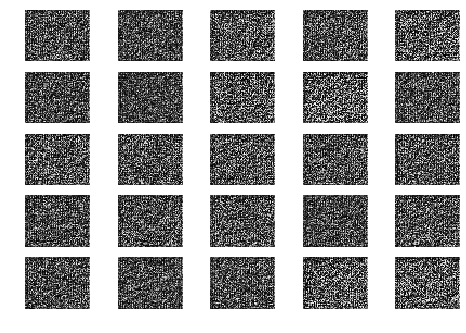

1 [D loss: 0.742298, acc.: 59.38%] [G loss: 1.237989]
2 [D loss: 0.558842, acc.: 71.88%] [G loss: 2.330130]
3 [D loss: 0.405590, acc.: 81.25%] [G loss: 2.126148]
4 [D loss: 0.290028, acc.: 90.62%] [G loss: 2.061643]
5 [D loss: 0.231035, acc.: 93.75%] [G loss: 2.057304]
6 [D loss: 0.191600, acc.: 93.75%] [G loss: 2.016222]
7 [D loss: 0.107403, acc.: 98.44%] [G loss: 1.334683]
8 [D loss: 0.245023, acc.: 89.06%] [G loss: 1.852360]
9 [D loss: 0.175238, acc.: 98.44%] [G loss: 2.007020]
10 [D loss: 0.278005, acc.: 92.19%] [G loss: 1.971967]
11 [D loss: 0.221930, acc.: 89.06%] [G loss: 2.726128]
12 [D loss: 0.166514, acc.: 95.31%] [G loss: 2.458890]
13 [D loss: 0.272214, acc.: 92.19%] [G loss: 3.412220]
14 [D loss: 0.354194, acc.: 84.38%] [G loss: 2.921217]
15 [D loss: 0.407647, acc.: 85.94%] [G loss: 2.735328]
16 [D loss: 0.209351, acc.: 93.75%] [G loss: 3.631005]
17 [D loss: 0.116465, acc.: 98.44%] [G loss: 3.114039]
18 [D loss: 0.300143, acc.: 85.94%] [G loss: 2.952710]
19 [D loss: 0.35437

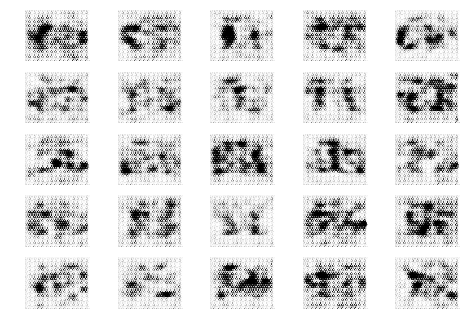

51 [D loss: 1.388821, acc.: 39.06%] [G loss: 2.232817]
52 [D loss: 1.222457, acc.: 51.56%] [G loss: 3.356192]
53 [D loss: 1.310303, acc.: 45.31%] [G loss: 3.301742]
54 [D loss: 1.603084, acc.: 39.06%] [G loss: 2.755448]
55 [D loss: 0.983728, acc.: 50.00%] [G loss: 3.059631]
56 [D loss: 1.108511, acc.: 57.81%] [G loss: 3.424598]
57 [D loss: 1.234235, acc.: 39.06%] [G loss: 2.991948]
58 [D loss: 1.074736, acc.: 39.06%] [G loss: 2.669144]
59 [D loss: 0.808456, acc.: 62.50%] [G loss: 2.956899]
60 [D loss: 0.910071, acc.: 59.38%] [G loss: 2.300550]
61 [D loss: 1.606633, acc.: 34.38%] [G loss: 3.244920]
62 [D loss: 1.084577, acc.: 59.38%] [G loss: 2.820089]
63 [D loss: 1.051523, acc.: 40.62%] [G loss: 2.063598]
64 [D loss: 1.365985, acc.: 40.62%] [G loss: 2.700697]
65 [D loss: 1.668062, acc.: 29.69%] [G loss: 2.493614]
66 [D loss: 1.678796, acc.: 21.88%] [G loss: 2.994905]
67 [D loss: 1.373880, acc.: 43.75%] [G loss: 1.916084]
68 [D loss: 1.027060, acc.: 45.31%] [G loss: 2.195228]
69 [D loss

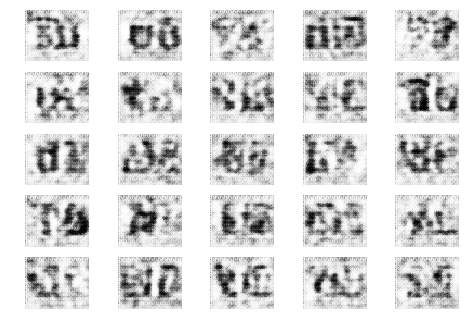

101 [D loss: 1.110250, acc.: 37.50%] [G loss: 2.172715]
102 [D loss: 1.055696, acc.: 46.88%] [G loss: 1.821304]
103 [D loss: 1.499920, acc.: 32.81%] [G loss: 2.130519]
104 [D loss: 0.929280, acc.: 62.50%] [G loss: 2.012445]
105 [D loss: 1.045805, acc.: 46.88%] [G loss: 2.101472]
106 [D loss: 0.951165, acc.: 48.44%] [G loss: 2.140248]
107 [D loss: 1.064855, acc.: 42.19%] [G loss: 1.868919]
108 [D loss: 0.937186, acc.: 45.31%] [G loss: 2.399210]
109 [D loss: 0.906546, acc.: 50.00%] [G loss: 2.155795]
110 [D loss: 0.829057, acc.: 60.94%] [G loss: 1.823173]
111 [D loss: 0.981662, acc.: 56.25%] [G loss: 1.843758]
112 [D loss: 1.140452, acc.: 43.75%] [G loss: 1.823698]
113 [D loss: 1.299992, acc.: 37.50%] [G loss: 1.529136]
114 [D loss: 0.928869, acc.: 53.12%] [G loss: 2.130064]
115 [D loss: 1.147116, acc.: 50.00%] [G loss: 1.732586]
116 [D loss: 1.098173, acc.: 48.44%] [G loss: 1.816816]
117 [D loss: 1.211107, acc.: 42.19%] [G loss: 1.898226]
118 [D loss: 1.416112, acc.: 26.56%] [G loss: 1.

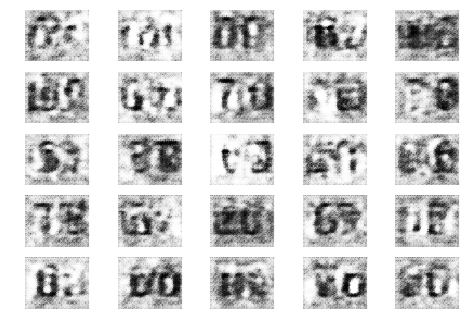

151 [D loss: 1.068064, acc.: 35.94%] [G loss: 1.560314]
152 [D loss: 0.910389, acc.: 43.75%] [G loss: 2.033907]
153 [D loss: 0.892352, acc.: 53.12%] [G loss: 2.535265]
154 [D loss: 0.486972, acc.: 75.00%] [G loss: 2.308725]
155 [D loss: 0.659964, acc.: 65.62%] [G loss: 2.232986]
156 [D loss: 0.853376, acc.: 50.00%] [G loss: 1.531209]
157 [D loss: 0.934958, acc.: 53.12%] [G loss: 2.074363]
158 [D loss: 1.197490, acc.: 50.00%] [G loss: 1.126099]
159 [D loss: 1.305095, acc.: 42.19%] [G loss: 1.500325]
160 [D loss: 1.476434, acc.: 34.38%] [G loss: 1.748688]
161 [D loss: 0.696418, acc.: 67.19%] [G loss: 2.154842]
162 [D loss: 0.747247, acc.: 62.50%] [G loss: 1.837011]
163 [D loss: 1.479131, acc.: 32.81%] [G loss: 1.469706]
164 [D loss: 1.299744, acc.: 37.50%] [G loss: 2.141756]
165 [D loss: 0.746322, acc.: 59.38%] [G loss: 2.192008]
166 [D loss: 1.083676, acc.: 50.00%] [G loss: 1.649733]
167 [D loss: 0.602801, acc.: 67.19%] [G loss: 1.470715]
168 [D loss: 1.011037, acc.: 51.56%] [G loss: 1.

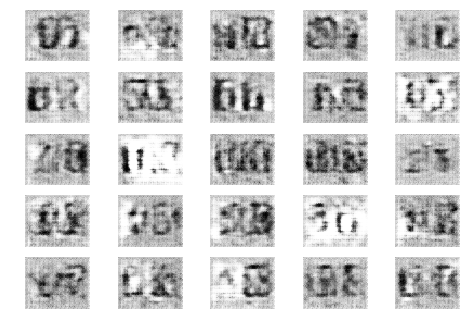

201 [D loss: 0.875357, acc.: 59.38%] [G loss: 1.461251]
202 [D loss: 1.065460, acc.: 37.50%] [G loss: 2.154153]
203 [D loss: 0.712749, acc.: 65.62%] [G loss: 1.940409]
204 [D loss: 1.114131, acc.: 51.56%] [G loss: 1.202256]
205 [D loss: 0.983256, acc.: 35.94%] [G loss: 1.523309]
206 [D loss: 0.579697, acc.: 71.88%] [G loss: 2.091602]
207 [D loss: 0.938350, acc.: 53.12%] [G loss: 1.549152]
208 [D loss: 1.015256, acc.: 45.31%] [G loss: 1.830817]
209 [D loss: 0.842725, acc.: 54.69%] [G loss: 2.464868]
210 [D loss: 1.124106, acc.: 50.00%] [G loss: 2.144525]
211 [D loss: 0.633638, acc.: 70.31%] [G loss: 1.710062]
212 [D loss: 0.814244, acc.: 57.81%] [G loss: 1.678907]
213 [D loss: 1.324822, acc.: 29.69%] [G loss: 1.594808]
214 [D loss: 0.542920, acc.: 73.44%] [G loss: 2.252768]
215 [D loss: 0.825776, acc.: 50.00%] [G loss: 2.038986]
216 [D loss: 0.665294, acc.: 73.44%] [G loss: 1.351966]
217 [D loss: 0.552238, acc.: 76.56%] [G loss: 1.799711]
218 [D loss: 0.894449, acc.: 53.12%] [G loss: 2.

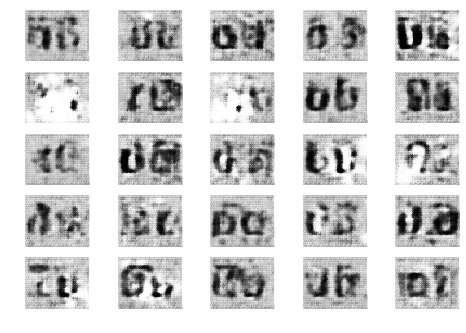

251 [D loss: 1.012677, acc.: 43.75%] [G loss: 1.192981]
252 [D loss: 0.974929, acc.: 56.25%] [G loss: 2.388568]
253 [D loss: 0.566035, acc.: 68.75%] [G loss: 2.458064]
254 [D loss: 0.913945, acc.: 54.69%] [G loss: 1.563046]
255 [D loss: 0.882055, acc.: 54.69%] [G loss: 1.352233]
256 [D loss: 0.883231, acc.: 53.12%] [G loss: 1.774348]
257 [D loss: 0.876198, acc.: 48.44%] [G loss: 2.486520]
258 [D loss: 0.625195, acc.: 65.62%] [G loss: 2.294271]
259 [D loss: 0.862123, acc.: 56.25%] [G loss: 1.387228]
260 [D loss: 0.756613, acc.: 60.94%] [G loss: 1.607066]
261 [D loss: 0.663667, acc.: 62.50%] [G loss: 2.032053]
262 [D loss: 0.884623, acc.: 59.38%] [G loss: 2.337630]
263 [D loss: 1.215746, acc.: 34.38%] [G loss: 1.371488]
264 [D loss: 1.172612, acc.: 39.06%] [G loss: 1.706507]
265 [D loss: 1.025262, acc.: 51.56%] [G loss: 1.666447]
266 [D loss: 0.788622, acc.: 54.69%] [G loss: 1.796576]
267 [D loss: 0.944929, acc.: 37.50%] [G loss: 2.052031]
268 [D loss: 1.253571, acc.: 43.75%] [G loss: 1.

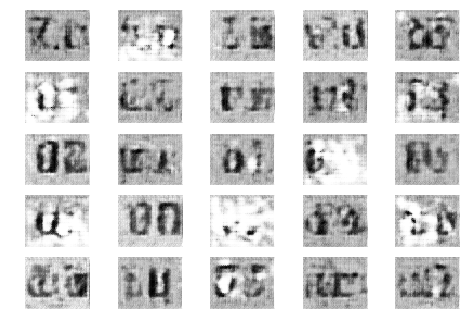

301 [D loss: 1.039167, acc.: 46.88%] [G loss: 1.791395]
302 [D loss: 0.504312, acc.: 76.56%] [G loss: 1.968744]
303 [D loss: 0.732422, acc.: 64.06%] [G loss: 2.251591]
304 [D loss: 1.020283, acc.: 50.00%] [G loss: 1.206512]
305 [D loss: 0.868613, acc.: 59.38%] [G loss: 2.197266]
306 [D loss: 0.658468, acc.: 62.50%] [G loss: 1.914117]
307 [D loss: 0.657934, acc.: 59.38%] [G loss: 2.143960]
308 [D loss: 0.638398, acc.: 64.06%] [G loss: 2.217712]
309 [D loss: 0.358859, acc.: 82.81%] [G loss: 2.365182]
310 [D loss: 1.257242, acc.: 32.81%] [G loss: 1.346479]
311 [D loss: 0.536203, acc.: 82.81%] [G loss: 1.927495]
312 [D loss: 1.236645, acc.: 45.31%] [G loss: 1.417232]
313 [D loss: 0.737864, acc.: 64.06%] [G loss: 1.821787]
314 [D loss: 0.685438, acc.: 64.06%] [G loss: 1.995062]
315 [D loss: 1.107144, acc.: 43.75%] [G loss: 2.074003]
316 [D loss: 0.466347, acc.: 75.00%] [G loss: 1.443696]
317 [D loss: 1.020379, acc.: 34.38%] [G loss: 2.089484]
318 [D loss: 1.096956, acc.: 39.06%] [G loss: 1.

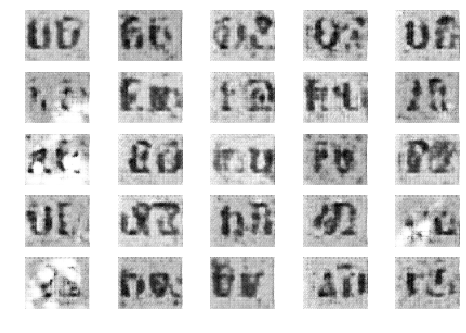

351 [D loss: 0.860694, acc.: 60.94%] [G loss: 1.768170]
352 [D loss: 0.842766, acc.: 54.69%] [G loss: 1.902837]
353 [D loss: 0.591545, acc.: 75.00%] [G loss: 1.766876]
354 [D loss: 0.584951, acc.: 78.12%] [G loss: 2.223414]
355 [D loss: 1.124152, acc.: 39.06%] [G loss: 1.586667]
356 [D loss: 0.903763, acc.: 50.00%] [G loss: 1.428253]
357 [D loss: 0.801162, acc.: 50.00%] [G loss: 2.644226]
358 [D loss: 0.601348, acc.: 68.75%] [G loss: 2.357742]
359 [D loss: 0.690576, acc.: 64.06%] [G loss: 1.607860]
360 [D loss: 1.075269, acc.: 39.06%] [G loss: 1.148955]
361 [D loss: 0.496771, acc.: 70.31%] [G loss: 1.760072]
362 [D loss: 1.064797, acc.: 40.62%] [G loss: 1.613146]
363 [D loss: 0.786948, acc.: 51.56%] [G loss: 1.770967]
364 [D loss: 0.685918, acc.: 60.94%] [G loss: 1.720835]
365 [D loss: 0.613238, acc.: 65.62%] [G loss: 1.979529]
366 [D loss: 0.705220, acc.: 54.69%] [G loss: 1.597108]
367 [D loss: 0.982139, acc.: 45.31%] [G loss: 1.343241]
368 [D loss: 0.547843, acc.: 71.88%] [G loss: 1.

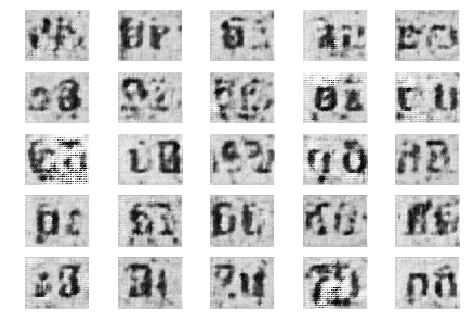

401 [D loss: 0.656831, acc.: 70.31%] [G loss: 1.171700]
402 [D loss: 0.659293, acc.: 67.19%] [G loss: 1.282321]
403 [D loss: 0.790304, acc.: 56.25%] [G loss: 1.363368]
404 [D loss: 0.654247, acc.: 62.50%] [G loss: 1.761452]
405 [D loss: 1.039247, acc.: 42.19%] [G loss: 1.639760]
406 [D loss: 1.036407, acc.: 46.88%] [G loss: 1.491875]
407 [D loss: 0.510671, acc.: 73.44%] [G loss: 1.769386]
408 [D loss: 0.931303, acc.: 42.19%] [G loss: 1.399707]
409 [D loss: 0.934473, acc.: 53.12%] [G loss: 2.091535]
410 [D loss: 0.462840, acc.: 84.38%] [G loss: 2.573122]
411 [D loss: 1.046739, acc.: 42.19%] [G loss: 1.619794]
412 [D loss: 0.480125, acc.: 71.88%] [G loss: 1.746953]
413 [D loss: 0.802518, acc.: 50.00%] [G loss: 2.309144]
414 [D loss: 0.857712, acc.: 48.44%] [G loss: 1.966720]
415 [D loss: 0.990134, acc.: 50.00%] [G loss: 1.852505]
416 [D loss: 0.627699, acc.: 68.75%] [G loss: 1.985999]
417 [D loss: 0.948500, acc.: 51.56%] [G loss: 1.474433]
418 [D loss: 0.662602, acc.: 71.88%] [G loss: 2.

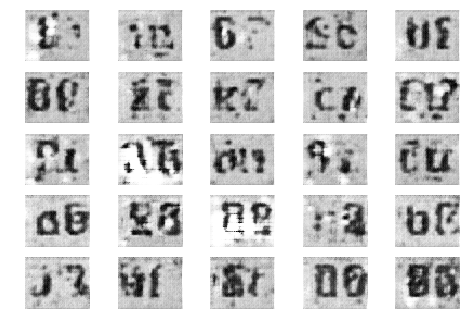

451 [D loss: 0.994397, acc.: 45.31%] [G loss: 1.078204]
452 [D loss: 0.969005, acc.: 35.94%] [G loss: 1.187305]
453 [D loss: 0.625917, acc.: 53.12%] [G loss: 1.566721]
454 [D loss: 0.478062, acc.: 76.56%] [G loss: 1.774395]
455 [D loss: 0.584766, acc.: 71.88%] [G loss: 2.036003]
456 [D loss: 0.873150, acc.: 48.44%] [G loss: 1.499744]
457 [D loss: 0.925903, acc.: 46.88%] [G loss: 2.390629]
458 [D loss: 0.653881, acc.: 59.38%] [G loss: 2.340410]
459 [D loss: 0.565430, acc.: 71.88%] [G loss: 1.930739]
460 [D loss: 1.054190, acc.: 39.06%] [G loss: 1.157145]
461 [D loss: 0.766071, acc.: 60.94%] [G loss: 1.114271]
462 [D loss: 0.632089, acc.: 70.31%] [G loss: 2.015588]
463 [D loss: 0.669734, acc.: 67.19%] [G loss: 1.702339]
464 [D loss: 0.829522, acc.: 54.69%] [G loss: 1.335459]
465 [D loss: 0.742431, acc.: 65.62%] [G loss: 1.757890]
466 [D loss: 0.762584, acc.: 62.50%] [G loss: 1.457594]
467 [D loss: 0.825075, acc.: 48.44%] [G loss: 1.777887]
468 [D loss: 0.747935, acc.: 54.69%] [G loss: 2.

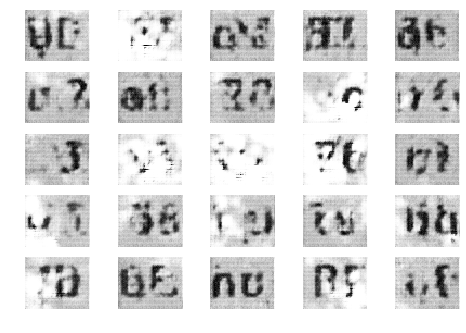

501 [D loss: 0.958412, acc.: 56.25%] [G loss: 1.760889]
502 [D loss: 0.713300, acc.: 62.50%] [G loss: 2.143761]
503 [D loss: 0.705391, acc.: 67.19%] [G loss: 1.490688]
504 [D loss: 0.438635, acc.: 79.69%] [G loss: 1.958693]
505 [D loss: 1.035337, acc.: 39.06%] [G loss: 1.816255]
506 [D loss: 0.484621, acc.: 79.69%] [G loss: 2.133052]
507 [D loss: 0.691088, acc.: 70.31%] [G loss: 1.938209]
508 [D loss: 0.696999, acc.: 67.19%] [G loss: 2.339643]
509 [D loss: 1.029070, acc.: 43.75%] [G loss: 1.430942]
510 [D loss: 0.588696, acc.: 65.62%] [G loss: 1.939335]
511 [D loss: 0.462922, acc.: 79.69%] [G loss: 1.988845]
512 [D loss: 0.513717, acc.: 75.00%] [G loss: 1.744626]
513 [D loss: 0.936497, acc.: 48.44%] [G loss: 1.282856]
514 [D loss: 0.919465, acc.: 53.12%] [G loss: 1.395051]
515 [D loss: 0.394915, acc.: 81.25%] [G loss: 2.353621]
516 [D loss: 0.791103, acc.: 56.25%] [G loss: 1.934402]
517 [D loss: 1.139628, acc.: 42.19%] [G loss: 1.690093]
518 [D loss: 0.531973, acc.: 76.56%] [G loss: 1.

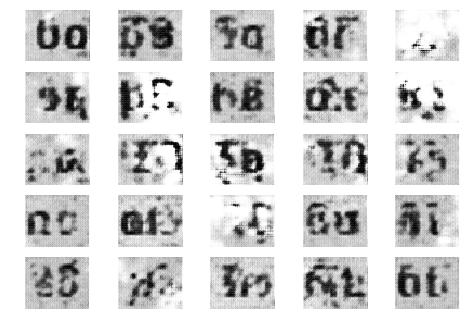

551 [D loss: 0.646082, acc.: 68.75%] [G loss: 1.608677]
552 [D loss: 0.634717, acc.: 68.75%] [G loss: 2.127536]
553 [D loss: 0.554679, acc.: 75.00%] [G loss: 1.453016]
554 [D loss: 0.450276, acc.: 84.38%] [G loss: 1.487493]
555 [D loss: 0.824428, acc.: 46.88%] [G loss: 0.904766]
556 [D loss: 0.736653, acc.: 56.25%] [G loss: 1.247872]
557 [D loss: 0.821264, acc.: 57.81%] [G loss: 1.873692]
558 [D loss: 0.399425, acc.: 82.81%] [G loss: 2.065754]
559 [D loss: 0.580583, acc.: 71.88%] [G loss: 2.166681]
560 [D loss: 0.857150, acc.: 46.88%] [G loss: 1.499115]
561 [D loss: 1.038265, acc.: 37.50%] [G loss: 2.104379]
562 [D loss: 0.850113, acc.: 54.69%] [G loss: 1.921053]
563 [D loss: 0.509161, acc.: 71.88%] [G loss: 2.477743]
564 [D loss: 0.704699, acc.: 62.50%] [G loss: 2.158415]
565 [D loss: 0.745998, acc.: 57.81%] [G loss: 1.452739]
566 [D loss: 0.405516, acc.: 81.25%] [G loss: 1.846532]
567 [D loss: 1.158964, acc.: 34.38%] [G loss: 1.139341]
568 [D loss: 0.628427, acc.: 68.75%] [G loss: 1.

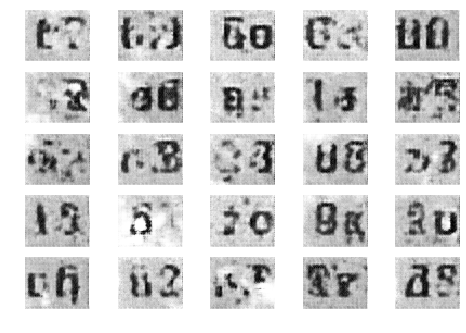

601 [D loss: 0.742856, acc.: 56.25%] [G loss: 2.201970]
602 [D loss: 0.640837, acc.: 64.06%] [G loss: 2.392939]
603 [D loss: 1.200724, acc.: 35.94%] [G loss: 1.202681]
604 [D loss: 0.969727, acc.: 50.00%] [G loss: 1.688752]
605 [D loss: 0.863832, acc.: 51.56%] [G loss: 1.922700]
606 [D loss: 0.802587, acc.: 64.06%] [G loss: 1.694675]
607 [D loss: 0.633839, acc.: 62.50%] [G loss: 1.818796]
608 [D loss: 0.525504, acc.: 76.56%] [G loss: 1.748836]
609 [D loss: 0.961850, acc.: 39.06%] [G loss: 1.540588]
610 [D loss: 0.729977, acc.: 59.38%] [G loss: 2.438302]
611 [D loss: 0.569204, acc.: 71.88%] [G loss: 2.567483]
612 [D loss: 0.721613, acc.: 64.06%] [G loss: 1.757279]
613 [D loss: 0.768571, acc.: 60.94%] [G loss: 1.371780]
614 [D loss: 0.673865, acc.: 59.38%] [G loss: 2.047741]
615 [D loss: 0.906160, acc.: 56.25%] [G loss: 2.151618]
616 [D loss: 0.858780, acc.: 50.00%] [G loss: 1.579661]
617 [D loss: 0.519021, acc.: 71.88%] [G loss: 2.149718]
618 [D loss: 0.398771, acc.: 81.25%] [G loss: 2.

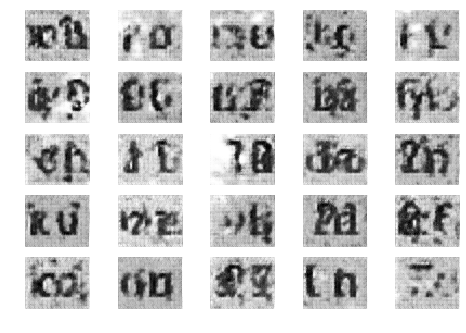

651 [D loss: 0.898373, acc.: 56.25%] [G loss: 1.942669]
652 [D loss: 1.065952, acc.: 45.31%] [G loss: 1.912073]
653 [D loss: 0.529843, acc.: 76.56%] [G loss: 2.178973]
654 [D loss: 0.531573, acc.: 73.44%] [G loss: 2.088791]
655 [D loss: 0.336941, acc.: 89.06%] [G loss: 3.098431]
656 [D loss: 0.361737, acc.: 85.94%] [G loss: 2.595847]
657 [D loss: 0.367878, acc.: 85.94%] [G loss: 2.664201]
658 [D loss: 0.369031, acc.: 85.94%] [G loss: 2.592985]
659 [D loss: 0.438794, acc.: 79.69%] [G loss: 2.181477]
660 [D loss: 0.449562, acc.: 82.81%] [G loss: 2.198214]
661 [D loss: 0.482796, acc.: 75.00%] [G loss: 2.021777]
662 [D loss: 1.217129, acc.: 28.12%] [G loss: 0.752516]
663 [D loss: 0.343099, acc.: 89.06%] [G loss: 1.600235]
664 [D loss: 0.974539, acc.: 37.50%] [G loss: 0.657011]
665 [D loss: 0.839022, acc.: 51.56%] [G loss: 0.909262]
666 [D loss: 0.671334, acc.: 60.94%] [G loss: 1.277308]
667 [D loss: 0.708609, acc.: 64.06%] [G loss: 1.605194]
668 [D loss: 0.802468, acc.: 56.25%] [G loss: 1.

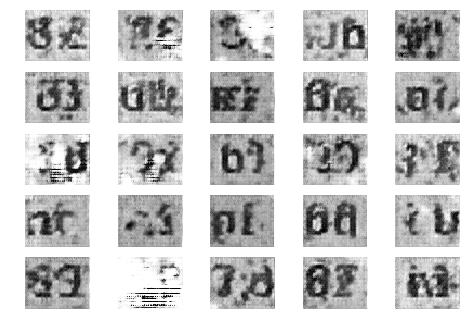

701 [D loss: 0.993592, acc.: 35.94%] [G loss: 1.464167]
702 [D loss: 0.592393, acc.: 75.00%] [G loss: 1.450431]
703 [D loss: 0.470875, acc.: 82.81%] [G loss: 2.319303]
704 [D loss: 0.855666, acc.: 43.75%] [G loss: 1.163311]
705 [D loss: 0.759605, acc.: 56.25%] [G loss: 1.479114]
706 [D loss: 0.461919, acc.: 75.00%] [G loss: 1.854193]
707 [D loss: 0.738681, acc.: 53.12%] [G loss: 1.426468]
708 [D loss: 0.591910, acc.: 81.25%] [G loss: 1.470193]
709 [D loss: 0.828020, acc.: 56.25%] [G loss: 1.644525]
710 [D loss: 0.642494, acc.: 64.06%] [G loss: 1.056994]
711 [D loss: 0.450499, acc.: 73.44%] [G loss: 1.761920]
712 [D loss: 0.819269, acc.: 53.12%] [G loss: 2.218224]
713 [D loss: 0.949758, acc.: 46.88%] [G loss: 1.905347]
714 [D loss: 0.702364, acc.: 60.94%] [G loss: 1.855963]
715 [D loss: 0.601255, acc.: 76.56%] [G loss: 2.661422]
716 [D loss: 1.064298, acc.: 48.44%] [G loss: 1.848488]
717 [D loss: 0.613347, acc.: 64.06%] [G loss: 2.090408]
718 [D loss: 0.805025, acc.: 51.56%] [G loss: 2.

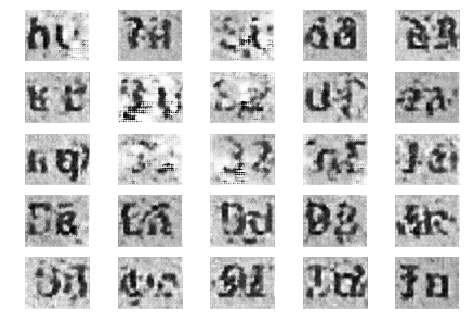

751 [D loss: 0.780812, acc.: 56.25%] [G loss: 1.812419]
752 [D loss: 0.675014, acc.: 60.94%] [G loss: 1.532807]
753 [D loss: 0.705940, acc.: 67.19%] [G loss: 1.774372]
754 [D loss: 0.854621, acc.: 53.12%] [G loss: 2.070762]
755 [D loss: 0.733579, acc.: 65.62%] [G loss: 1.590133]
756 [D loss: 0.511209, acc.: 75.00%] [G loss: 1.875944]
757 [D loss: 0.614899, acc.: 70.31%] [G loss: 2.173071]
758 [D loss: 0.529567, acc.: 71.88%] [G loss: 2.153733]
759 [D loss: 0.674015, acc.: 60.94%] [G loss: 2.253792]
760 [D loss: 0.371833, acc.: 90.62%] [G loss: 2.955899]
761 [D loss: 0.648711, acc.: 70.31%] [G loss: 2.628620]
762 [D loss: 0.384288, acc.: 84.38%] [G loss: 2.830333]
763 [D loss: 0.330587, acc.: 89.06%] [G loss: 2.250615]
764 [D loss: 0.699961, acc.: 62.50%] [G loss: 1.234810]
765 [D loss: 1.081353, acc.: 45.31%] [G loss: 1.390774]
766 [D loss: 0.692668, acc.: 59.38%] [G loss: 2.710798]
767 [D loss: 0.917439, acc.: 50.00%] [G loss: 2.515015]
768 [D loss: 0.883451, acc.: 43.75%] [G loss: 1.

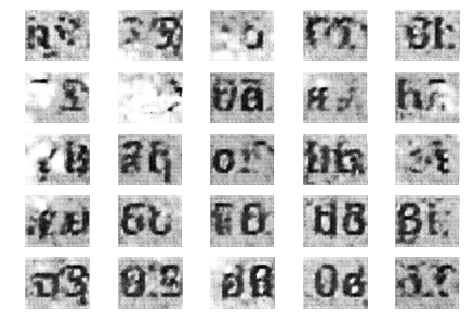

801 [D loss: 0.567272, acc.: 68.75%] [G loss: 1.891733]
802 [D loss: 0.530045, acc.: 76.56%] [G loss: 1.508610]
803 [D loss: 0.644798, acc.: 75.00%] [G loss: 2.108145]
804 [D loss: 0.608978, acc.: 71.88%] [G loss: 1.999424]
805 [D loss: 0.581410, acc.: 59.38%] [G loss: 2.223215]
806 [D loss: 0.498705, acc.: 78.12%] [G loss: 2.213074]
807 [D loss: 0.901036, acc.: 43.75%] [G loss: 2.197564]
808 [D loss: 0.469138, acc.: 78.12%] [G loss: 1.888306]
809 [D loss: 0.551571, acc.: 70.31%] [G loss: 1.824862]
810 [D loss: 0.744512, acc.: 56.25%] [G loss: 1.788171]
811 [D loss: 0.626210, acc.: 78.12%] [G loss: 2.179893]
812 [D loss: 0.566230, acc.: 60.94%] [G loss: 2.238266]
813 [D loss: 1.051178, acc.: 37.50%] [G loss: 1.487963]
814 [D loss: 0.837378, acc.: 51.56%] [G loss: 1.610291]
815 [D loss: 0.345629, acc.: 87.50%] [G loss: 2.347164]
816 [D loss: 0.482459, acc.: 76.56%] [G loss: 2.061725]
817 [D loss: 0.511201, acc.: 68.75%] [G loss: 2.465175]
818 [D loss: 0.617372, acc.: 62.50%] [G loss: 1.

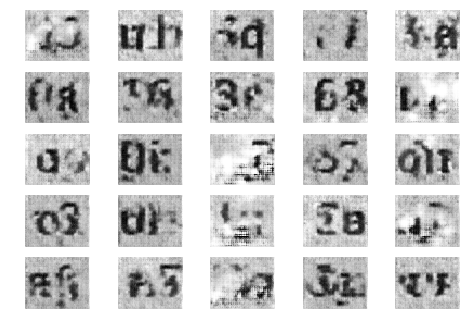

851 [D loss: 0.790096, acc.: 59.38%] [G loss: 2.326390]
852 [D loss: 0.441495, acc.: 75.00%] [G loss: 1.888281]
853 [D loss: 0.714633, acc.: 62.50%] [G loss: 1.658972]
854 [D loss: 0.853853, acc.: 46.88%] [G loss: 1.384235]
855 [D loss: 0.457614, acc.: 82.81%] [G loss: 2.206250]
856 [D loss: 0.836806, acc.: 53.12%] [G loss: 1.641784]
857 [D loss: 0.509275, acc.: 79.69%] [G loss: 2.697019]
858 [D loss: 0.836634, acc.: 54.69%] [G loss: 1.402544]
859 [D loss: 0.498904, acc.: 75.00%] [G loss: 1.077850]
860 [D loss: 0.373856, acc.: 82.81%] [G loss: 2.398890]
861 [D loss: 0.764599, acc.: 48.44%] [G loss: 1.395294]
862 [D loss: 0.659204, acc.: 62.50%] [G loss: 1.136200]
863 [D loss: 0.783008, acc.: 64.06%] [G loss: 1.838086]
864 [D loss: 0.605563, acc.: 68.75%] [G loss: 2.251031]
865 [D loss: 0.795691, acc.: 51.56%] [G loss: 1.247784]
866 [D loss: 0.722722, acc.: 65.62%] [G loss: 2.063100]
867 [D loss: 0.520128, acc.: 73.44%] [G loss: 2.154980]
868 [D loss: 0.593822, acc.: 65.62%] [G loss: 2.

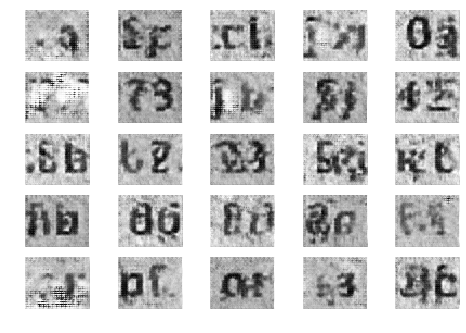

901 [D loss: 0.732899, acc.: 64.06%] [G loss: 0.843409]
902 [D loss: 0.680897, acc.: 60.94%] [G loss: 1.391285]
903 [D loss: 0.460837, acc.: 71.88%] [G loss: 2.296548]
904 [D loss: 0.667745, acc.: 65.62%] [G loss: 1.941048]
905 [D loss: 0.786429, acc.: 57.81%] [G loss: 1.874610]
906 [D loss: 0.635684, acc.: 71.88%] [G loss: 1.777527]
907 [D loss: 0.581816, acc.: 73.44%] [G loss: 1.984112]
908 [D loss: 0.772152, acc.: 68.75%] [G loss: 1.793100]
909 [D loss: 0.864381, acc.: 48.44%] [G loss: 2.204528]
910 [D loss: 0.589334, acc.: 78.12%] [G loss: 2.166598]
911 [D loss: 0.658865, acc.: 68.75%] [G loss: 1.613679]
912 [D loss: 0.584599, acc.: 70.31%] [G loss: 1.867069]
913 [D loss: 0.914406, acc.: 46.88%] [G loss: 2.300991]
914 [D loss: 0.710402, acc.: 62.50%] [G loss: 1.719908]
915 [D loss: 0.675756, acc.: 65.62%] [G loss: 2.274061]
916 [D loss: 0.744597, acc.: 59.38%] [G loss: 2.391561]
917 [D loss: 0.940634, acc.: 50.00%] [G loss: 1.843242]
918 [D loss: 0.381677, acc.: 84.38%] [G loss: 1.

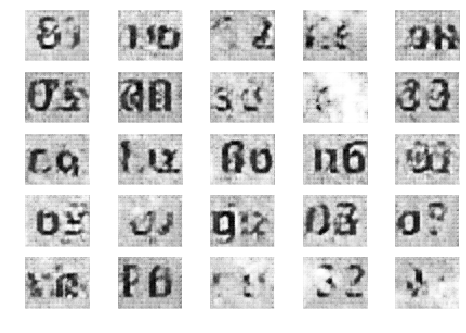

951 [D loss: 0.492034, acc.: 75.00%] [G loss: 2.352591]
952 [D loss: 1.063206, acc.: 34.38%] [G loss: 1.720415]
953 [D loss: 0.551708, acc.: 73.44%] [G loss: 1.944547]
954 [D loss: 0.851965, acc.: 57.81%] [G loss: 1.813049]
955 [D loss: 0.260414, acc.: 93.75%] [G loss: 2.554058]
956 [D loss: 0.435389, acc.: 79.69%] [G loss: 2.983059]
957 [D loss: 0.392674, acc.: 81.25%] [G loss: 2.602506]
958 [D loss: 0.361635, acc.: 85.94%] [G loss: 2.645520]
959 [D loss: 0.284460, acc.: 89.06%] [G loss: 2.873916]
960 [D loss: 1.030119, acc.: 48.44%] [G loss: 1.544279]
961 [D loss: 0.377746, acc.: 82.81%] [G loss: 2.101629]
962 [D loss: 0.281597, acc.: 90.62%] [G loss: 3.157122]
963 [D loss: 0.867885, acc.: 60.94%] [G loss: 1.866869]
964 [D loss: 0.676939, acc.: 67.19%] [G loss: 2.167086]
965 [D loss: 0.195744, acc.: 98.44%] [G loss: 2.794901]
966 [D loss: 0.863158, acc.: 54.69%] [G loss: 1.647669]
967 [D loss: 0.801142, acc.: 64.06%] [G loss: 1.597222]
968 [D loss: 0.657265, acc.: 62.50%] [G loss: 2.

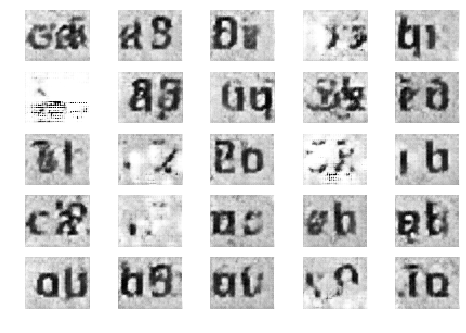

1001 [D loss: 0.548945, acc.: 75.00%] [G loss: 1.961175]
1002 [D loss: 1.082767, acc.: 37.50%] [G loss: 0.928869]
1003 [D loss: 0.466544, acc.: 75.00%] [G loss: 1.780566]
1004 [D loss: 0.346994, acc.: 85.94%] [G loss: 1.896361]
1005 [D loss: 0.502594, acc.: 75.00%] [G loss: 1.737695]
1006 [D loss: 0.519462, acc.: 71.88%] [G loss: 1.664341]
1007 [D loss: 0.714019, acc.: 70.31%] [G loss: 2.361303]
1008 [D loss: 0.745005, acc.: 64.06%] [G loss: 2.660563]
1009 [D loss: 0.619597, acc.: 68.75%] [G loss: 1.706384]
1010 [D loss: 0.595146, acc.: 67.19%] [G loss: 1.791951]
1011 [D loss: 0.558397, acc.: 81.25%] [G loss: 1.775475]
1012 [D loss: 0.673686, acc.: 64.06%] [G loss: 2.200740]
1013 [D loss: 0.490771, acc.: 75.00%] [G loss: 2.103409]
1014 [D loss: 0.640710, acc.: 64.06%] [G loss: 2.261500]
1015 [D loss: 0.513703, acc.: 75.00%] [G loss: 2.611012]
1016 [D loss: 1.078219, acc.: 42.19%] [G loss: 1.586135]
1017 [D loss: 0.698645, acc.: 64.06%] [G loss: 1.676633]
1018 [D loss: 0.595666, acc.: 6

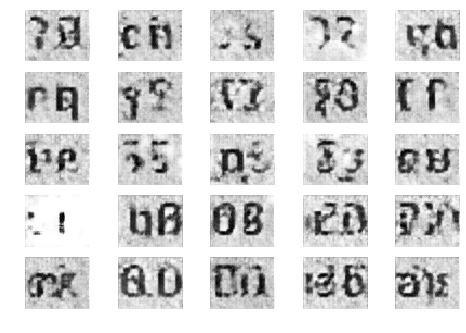

1051 [D loss: 0.809982, acc.: 53.12%] [G loss: 1.526425]
1052 [D loss: 0.442000, acc.: 82.81%] [G loss: 2.944224]
1053 [D loss: 0.352240, acc.: 81.25%] [G loss: 2.644591]
1054 [D loss: 0.866597, acc.: 46.88%] [G loss: 1.646209]
1055 [D loss: 0.619718, acc.: 75.00%] [G loss: 2.565641]
1056 [D loss: 0.648269, acc.: 75.00%] [G loss: 2.328091]
1057 [D loss: 0.443188, acc.: 73.44%] [G loss: 2.051098]
1058 [D loss: 0.832428, acc.: 54.69%] [G loss: 1.448613]
1059 [D loss: 0.637421, acc.: 68.75%] [G loss: 1.951310]
1060 [D loss: 0.660009, acc.: 71.88%] [G loss: 2.235181]
1061 [D loss: 0.580726, acc.: 70.31%] [G loss: 2.115356]
1062 [D loss: 0.397183, acc.: 82.81%] [G loss: 1.919708]
1063 [D loss: 0.626525, acc.: 62.50%] [G loss: 1.581299]
1064 [D loss: 0.536112, acc.: 75.00%] [G loss: 1.941627]
1065 [D loss: 0.320679, acc.: 87.50%] [G loss: 2.601492]
1066 [D loss: 0.735635, acc.: 56.25%] [G loss: 1.485356]
1067 [D loss: 0.628606, acc.: 65.62%] [G loss: 2.195826]
1068 [D loss: 0.824275, acc.: 6

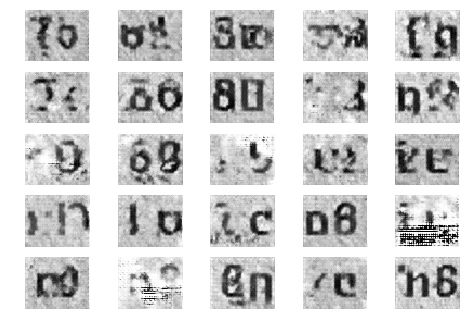

1101 [D loss: 0.811552, acc.: 53.12%] [G loss: 1.607120]
1102 [D loss: 0.471437, acc.: 76.56%] [G loss: 2.116320]
1103 [D loss: 0.733080, acc.: 68.75%] [G loss: 1.268044]
1104 [D loss: 0.471927, acc.: 85.94%] [G loss: 1.174040]
1105 [D loss: 0.649021, acc.: 60.94%] [G loss: 1.475691]
1106 [D loss: 0.665544, acc.: 65.62%] [G loss: 2.099278]
1107 [D loss: 0.508410, acc.: 76.56%] [G loss: 2.735854]
1108 [D loss: 0.780431, acc.: 57.81%] [G loss: 1.686020]
1109 [D loss: 0.553093, acc.: 67.19%] [G loss: 1.467322]
1110 [D loss: 0.593465, acc.: 75.00%] [G loss: 2.240173]
1111 [D loss: 0.609037, acc.: 68.75%] [G loss: 2.102349]
1112 [D loss: 0.664196, acc.: 60.94%] [G loss: 2.293909]
1113 [D loss: 0.573335, acc.: 67.19%] [G loss: 1.830682]
1114 [D loss: 0.478602, acc.: 79.69%] [G loss: 2.516334]
1115 [D loss: 0.545165, acc.: 68.75%] [G loss: 2.401613]
1116 [D loss: 0.504377, acc.: 79.69%] [G loss: 1.918236]
1117 [D loss: 0.554294, acc.: 71.88%] [G loss: 1.989102]
1118 [D loss: 0.646999, acc.: 7

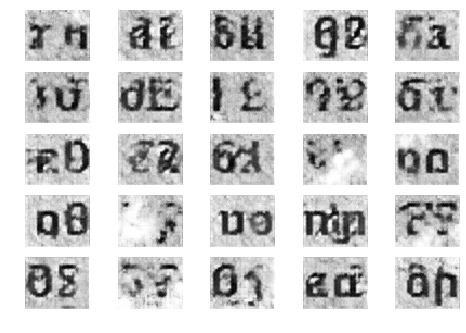

1151 [D loss: 0.272654, acc.: 95.31%] [G loss: 2.690165]
1152 [D loss: 0.290698, acc.: 89.06%] [G loss: 2.575359]
1153 [D loss: 0.696318, acc.: 62.50%] [G loss: 1.616780]
1154 [D loss: 0.769833, acc.: 56.25%] [G loss: 1.713803]
1155 [D loss: 0.305708, acc.: 89.06%] [G loss: 2.583276]
1156 [D loss: 1.000457, acc.: 48.44%] [G loss: 2.275645]
1157 [D loss: 0.479737, acc.: 84.38%] [G loss: 1.612942]
1158 [D loss: 0.375303, acc.: 81.25%] [G loss: 2.638536]
1159 [D loss: 0.290802, acc.: 87.50%] [G loss: 2.803884]
1160 [D loss: 0.438828, acc.: 84.38%] [G loss: 2.554334]
1161 [D loss: 0.303047, acc.: 85.94%] [G loss: 2.776772]
1162 [D loss: 0.741481, acc.: 64.06%] [G loss: 1.552394]
1163 [D loss: 0.481359, acc.: 78.12%] [G loss: 1.951612]
1164 [D loss: 0.250929, acc.: 95.31%] [G loss: 2.648763]
1165 [D loss: 0.289258, acc.: 90.62%] [G loss: 2.502965]
1166 [D loss: 0.169111, acc.: 100.00%] [G loss: 2.553053]
1167 [D loss: 0.883497, acc.: 56.25%] [G loss: 1.842515]
1168 [D loss: 0.265134, acc.: 

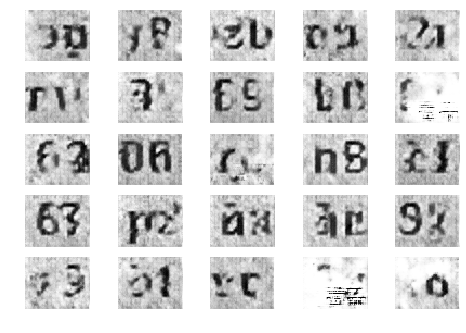

1201 [D loss: 0.550590, acc.: 70.31%] [G loss: 1.757335]
1202 [D loss: 0.636864, acc.: 60.94%] [G loss: 1.558004]
1203 [D loss: 0.759378, acc.: 59.38%] [G loss: 1.395604]
1204 [D loss: 0.392490, acc.: 85.94%] [G loss: 2.236655]
1205 [D loss: 0.778548, acc.: 57.81%] [G loss: 2.295799]
1206 [D loss: 0.518476, acc.: 78.12%] [G loss: 2.352577]
1207 [D loss: 0.679414, acc.: 70.31%] [G loss: 2.120859]
1208 [D loss: 0.846571, acc.: 51.56%] [G loss: 1.963733]
1209 [D loss: 0.588905, acc.: 71.88%] [G loss: 2.583286]
1210 [D loss: 0.511166, acc.: 75.00%] [G loss: 2.735006]
1211 [D loss: 0.669958, acc.: 60.94%] [G loss: 2.573673]
1212 [D loss: 0.542731, acc.: 76.56%] [G loss: 2.321158]
1213 [D loss: 0.497493, acc.: 79.69%] [G loss: 2.726727]
1214 [D loss: 0.463301, acc.: 75.00%] [G loss: 2.078108]
1215 [D loss: 0.591692, acc.: 68.75%] [G loss: 2.223442]
1216 [D loss: 0.357225, acc.: 85.94%] [G loss: 2.557421]
1217 [D loss: 0.646719, acc.: 65.62%] [G loss: 2.004491]
1218 [D loss: 0.464740, acc.: 7

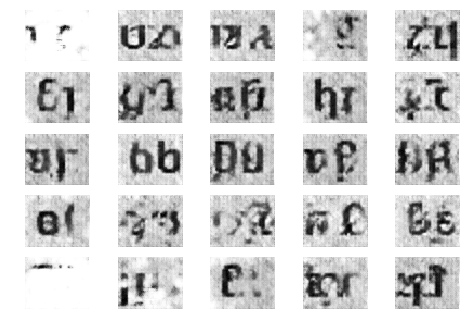

1251 [D loss: 0.331922, acc.: 90.62%] [G loss: 2.604781]
1252 [D loss: 0.200421, acc.: 95.31%] [G loss: 3.955546]
1253 [D loss: 1.039799, acc.: 56.25%] [G loss: 1.996780]
1254 [D loss: 0.239002, acc.: 90.62%] [G loss: 2.648803]
1255 [D loss: 0.151223, acc.: 98.44%] [G loss: 3.178469]
1256 [D loss: 0.759342, acc.: 59.38%] [G loss: 1.859065]
1257 [D loss: 0.231245, acc.: 90.62%] [G loss: 2.251386]
1258 [D loss: 0.137301, acc.: 98.44%] [G loss: 3.213968]
1259 [D loss: 0.131612, acc.: 100.00%] [G loss: 3.335944]
1260 [D loss: 0.936142, acc.: 50.00%] [G loss: 1.741034]
1261 [D loss: 0.367218, acc.: 76.56%] [G loss: 2.574402]
1262 [D loss: 0.133692, acc.: 98.44%] [G loss: 3.074671]
1263 [D loss: 0.211740, acc.: 96.88%] [G loss: 1.261851]
1264 [D loss: 0.997629, acc.: 51.56%] [G loss: 1.281862]
1265 [D loss: 0.999623, acc.: 51.56%] [G loss: 1.115830]
1266 [D loss: 0.591572, acc.: 68.75%] [G loss: 2.032242]
1267 [D loss: 0.226089, acc.: 95.31%] [G loss: 1.348706]
1268 [D loss: 0.578564, acc.: 

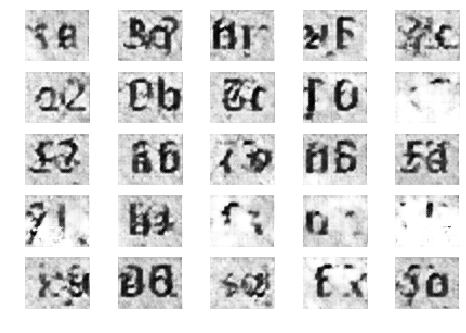

1301 [D loss: 0.837306, acc.: 53.12%] [G loss: 2.151414]
1302 [D loss: 0.456125, acc.: 75.00%] [G loss: 2.211614]
1303 [D loss: 0.530065, acc.: 73.44%] [G loss: 1.927665]
1304 [D loss: 0.340318, acc.: 84.38%] [G loss: 2.876844]
1305 [D loss: 0.606453, acc.: 71.88%] [G loss: 2.258450]
1306 [D loss: 0.486390, acc.: 78.12%] [G loss: 2.228345]
1307 [D loss: 0.236207, acc.: 96.88%] [G loss: 2.432114]
1308 [D loss: 0.324515, acc.: 89.06%] [G loss: 2.452983]
1309 [D loss: 0.726710, acc.: 62.50%] [G loss: 1.947332]
1310 [D loss: 0.230219, acc.: 92.19%] [G loss: 3.183892]
1311 [D loss: 0.175672, acc.: 93.75%] [G loss: 3.486737]
1312 [D loss: 0.193710, acc.: 98.44%] [G loss: 3.085135]
1313 [D loss: 0.719065, acc.: 67.19%] [G loss: 2.306688]
1314 [D loss: 0.281494, acc.: 89.06%] [G loss: 3.091065]
1315 [D loss: 0.627004, acc.: 65.62%] [G loss: 1.842751]
1316 [D loss: 0.165850, acc.: 95.31%] [G loss: 2.898705]
1317 [D loss: 0.257525, acc.: 93.75%] [G loss: 2.889718]
1318 [D loss: 0.373409, acc.: 8

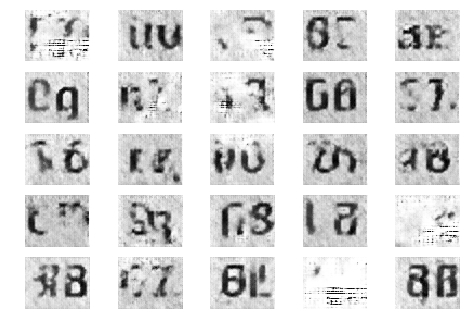

1351 [D loss: 0.471894, acc.: 73.44%] [G loss: 1.722815]
1352 [D loss: 0.878657, acc.: 50.00%] [G loss: 1.277466]
1353 [D loss: 0.479267, acc.: 87.50%] [G loss: 1.760409]
1354 [D loss: 0.523304, acc.: 81.25%] [G loss: 1.683664]
1355 [D loss: 0.552269, acc.: 71.88%] [G loss: 1.762441]
1356 [D loss: 0.270406, acc.: 92.19%] [G loss: 2.210682]
1357 [D loss: 0.503621, acc.: 70.31%] [G loss: 2.304007]
1358 [D loss: 0.598873, acc.: 73.44%] [G loss: 2.422827]
1359 [D loss: 0.469426, acc.: 76.56%] [G loss: 2.798608]
1360 [D loss: 0.739726, acc.: 62.50%] [G loss: 1.887050]
1361 [D loss: 0.794246, acc.: 60.94%] [G loss: 2.955509]
1362 [D loss: 0.506671, acc.: 76.56%] [G loss: 2.554226]
1363 [D loss: 0.591864, acc.: 70.31%] [G loss: 2.966117]
1364 [D loss: 0.401211, acc.: 79.69%] [G loss: 2.350901]
1365 [D loss: 0.537423, acc.: 73.44%] [G loss: 2.254158]
1366 [D loss: 0.387617, acc.: 79.69%] [G loss: 2.818995]
1367 [D loss: 0.445222, acc.: 82.81%] [G loss: 2.197996]
1368 [D loss: 0.682896, acc.: 6

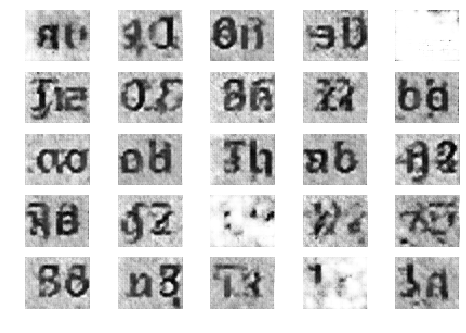

1401 [D loss: 0.627952, acc.: 67.19%] [G loss: 2.114852]
1402 [D loss: 0.505617, acc.: 70.31%] [G loss: 1.858243]
1403 [D loss: 0.491555, acc.: 79.69%] [G loss: 1.889135]
1404 [D loss: 0.268158, acc.: 95.31%] [G loss: 2.543067]
1405 [D loss: 0.625537, acc.: 67.19%] [G loss: 2.047852]
1406 [D loss: 0.223214, acc.: 92.19%] [G loss: 2.783719]
1407 [D loss: 0.559055, acc.: 75.00%] [G loss: 2.597453]
1408 [D loss: 0.804547, acc.: 60.94%] [G loss: 2.111034]
1409 [D loss: 0.544843, acc.: 70.31%] [G loss: 1.713763]
1410 [D loss: 0.310290, acc.: 89.06%] [G loss: 2.478464]
1411 [D loss: 0.461459, acc.: 75.00%] [G loss: 2.201942]
1412 [D loss: 0.334732, acc.: 87.50%] [G loss: 2.267752]
1413 [D loss: 1.076721, acc.: 43.75%] [G loss: 1.740736]
1414 [D loss: 0.419691, acc.: 79.69%] [G loss: 2.163829]
1415 [D loss: 0.370332, acc.: 79.69%] [G loss: 2.259010]
1416 [D loss: 0.113337, acc.: 100.00%] [G loss: 2.525854]
1417 [D loss: 0.718902, acc.: 62.50%] [G loss: 1.133431]
1418 [D loss: 0.338476, acc.: 

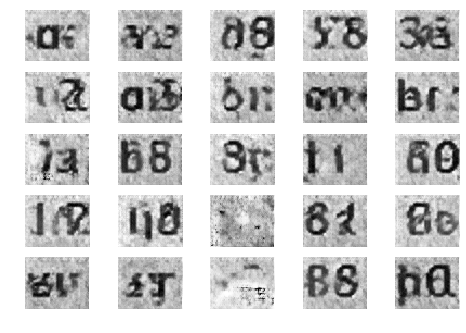

1451 [D loss: 0.320302, acc.: 82.81%] [G loss: 1.489207]
1452 [D loss: 0.492271, acc.: 71.88%] [G loss: 2.290394]
1453 [D loss: 0.348307, acc.: 79.69%] [G loss: 3.048399]
1454 [D loss: 0.624984, acc.: 71.88%] [G loss: 2.114753]
1455 [D loss: 0.779911, acc.: 59.38%] [G loss: 2.803928]
1456 [D loss: 0.620511, acc.: 64.06%] [G loss: 2.191566]
1457 [D loss: 0.650965, acc.: 57.81%] [G loss: 1.986852]
1458 [D loss: 0.553782, acc.: 78.12%] [G loss: 2.595340]
1459 [D loss: 0.711708, acc.: 56.25%] [G loss: 2.403695]
1460 [D loss: 0.635593, acc.: 67.19%] [G loss: 2.718904]
1461 [D loss: 0.545563, acc.: 70.31%] [G loss: 3.427682]
1462 [D loss: 0.413941, acc.: 87.50%] [G loss: 2.891408]
1463 [D loss: 0.620720, acc.: 68.75%] [G loss: 2.916837]
1464 [D loss: 0.671245, acc.: 65.62%] [G loss: 2.046704]
1465 [D loss: 0.267075, acc.: 92.19%] [G loss: 2.711546]
1466 [D loss: 0.757814, acc.: 60.94%] [G loss: 2.466916]
1467 [D loss: 0.511207, acc.: 73.44%] [G loss: 2.205882]
1468 [D loss: 0.273929, acc.: 8

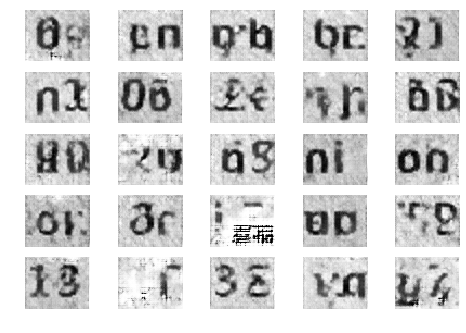

1501 [D loss: 0.764568, acc.: 68.75%] [G loss: 1.534377]
1502 [D loss: 0.540212, acc.: 73.44%] [G loss: 2.030754]
1503 [D loss: 0.393787, acc.: 84.38%] [G loss: 2.769768]
1504 [D loss: 0.668410, acc.: 64.06%] [G loss: 1.645499]
1505 [D loss: 0.487082, acc.: 75.00%] [G loss: 1.551917]
1506 [D loss: 0.497147, acc.: 85.94%] [G loss: 2.687384]
1507 [D loss: 0.415430, acc.: 82.81%] [G loss: 1.729150]
1508 [D loss: 0.522748, acc.: 76.56%] [G loss: 1.223996]
1509 [D loss: 0.427418, acc.: 81.25%] [G loss: 2.759403]
1510 [D loss: 0.638806, acc.: 65.62%] [G loss: 2.196455]
1511 [D loss: 0.431174, acc.: 82.81%] [G loss: 2.080010]
1512 [D loss: 0.415700, acc.: 84.38%] [G loss: 2.220184]
1513 [D loss: 0.367702, acc.: 81.25%] [G loss: 2.283920]
1514 [D loss: 0.520432, acc.: 78.12%] [G loss: 2.843169]
1515 [D loss: 0.584122, acc.: 75.00%] [G loss: 2.850101]
1516 [D loss: 0.583578, acc.: 65.62%] [G loss: 2.269241]
1517 [D loss: 0.630516, acc.: 64.06%] [G loss: 2.674597]
1518 [D loss: 0.511085, acc.: 7

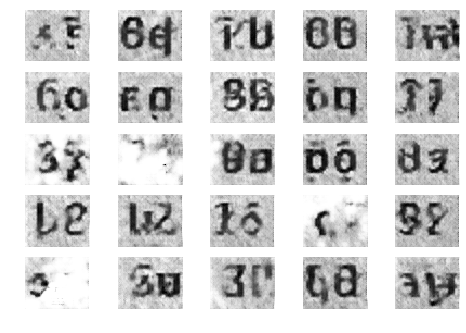

1551 [D loss: 0.144032, acc.: 95.31%] [G loss: 3.570572]
1552 [D loss: 0.584938, acc.: 73.44%] [G loss: 2.211744]
1553 [D loss: 0.845057, acc.: 51.56%] [G loss: 1.829248]
1554 [D loss: 0.221540, acc.: 92.19%] [G loss: 3.305460]
1555 [D loss: 0.704895, acc.: 65.62%] [G loss: 2.240872]
1556 [D loss: 0.644076, acc.: 70.31%] [G loss: 2.377918]
1557 [D loss: 0.156482, acc.: 93.75%] [G loss: 3.750271]
1558 [D loss: 0.152924, acc.: 96.88%] [G loss: 3.549222]
1559 [D loss: 0.135034, acc.: 98.44%] [G loss: 3.370092]
1560 [D loss: 0.877725, acc.: 56.25%] [G loss: 1.868910]
1561 [D loss: 0.639885, acc.: 73.44%] [G loss: 1.833162]
1562 [D loss: 0.274201, acc.: 90.62%] [G loss: 2.308650]
1563 [D loss: 0.093924, acc.: 100.00%] [G loss: 2.918171]
1564 [D loss: 1.340596, acc.: 35.94%] [G loss: 0.869297]
1565 [D loss: 0.488964, acc.: 75.00%] [G loss: 1.568221]
1566 [D loss: 0.779985, acc.: 53.12%] [G loss: 1.519880]
1567 [D loss: 0.442328, acc.: 81.25%] [G loss: 2.313478]
1568 [D loss: 0.765121, acc.: 

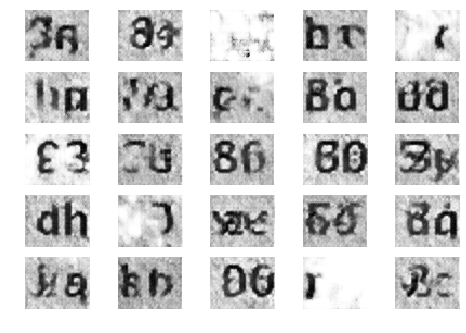

1601 [D loss: 0.372811, acc.: 84.38%] [G loss: 2.392972]
1602 [D loss: 0.426380, acc.: 78.12%] [G loss: 2.205438]
1603 [D loss: 0.393394, acc.: 82.81%] [G loss: 2.845592]
1604 [D loss: 0.366958, acc.: 81.25%] [G loss: 2.575714]
1605 [D loss: 0.550284, acc.: 67.19%] [G loss: 2.257931]
1606 [D loss: 0.855291, acc.: 60.94%] [G loss: 2.138222]
1607 [D loss: 0.310765, acc.: 84.38%] [G loss: 3.315896]
1608 [D loss: 0.629665, acc.: 67.19%] [G loss: 1.880024]
1609 [D loss: 0.724365, acc.: 64.06%] [G loss: 2.589294]
1610 [D loss: 0.340303, acc.: 84.38%] [G loss: 3.012309]
1611 [D loss: 0.399923, acc.: 79.69%] [G loss: 2.533908]
1612 [D loss: 0.573251, acc.: 75.00%] [G loss: 1.940906]
1613 [D loss: 0.327758, acc.: 87.50%] [G loss: 2.365964]
1614 [D loss: 0.247150, acc.: 90.62%] [G loss: 2.899800]
1615 [D loss: 0.281567, acc.: 90.62%] [G loss: 2.651831]
1616 [D loss: 0.220978, acc.: 92.19%] [G loss: 3.038326]
1617 [D loss: 0.754540, acc.: 59.38%] [G loss: 1.399884]
1618 [D loss: 0.554318, acc.: 6

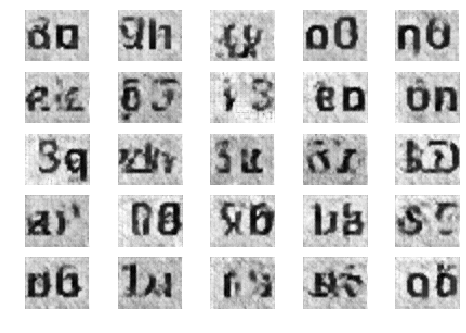

1651 [D loss: 0.493415, acc.: 79.69%] [G loss: 2.066139]
1652 [D loss: 0.295763, acc.: 92.19%] [G loss: 2.116641]
1653 [D loss: 0.819365, acc.: 54.69%] [G loss: 2.458311]
1654 [D loss: 0.353852, acc.: 81.25%] [G loss: 2.751979]
1655 [D loss: 0.589935, acc.: 73.44%] [G loss: 1.682889]
1656 [D loss: 0.638793, acc.: 73.44%] [G loss: 2.595479]
1657 [D loss: 0.523137, acc.: 79.69%] [G loss: 2.666243]
1658 [D loss: 0.534163, acc.: 75.00%] [G loss: 1.978223]
1659 [D loss: 0.559408, acc.: 70.31%] [G loss: 1.877068]
1660 [D loss: 0.301697, acc.: 93.75%] [G loss: 3.375592]
1661 [D loss: 0.604104, acc.: 67.19%] [G loss: 2.310333]
1662 [D loss: 0.705036, acc.: 57.81%] [G loss: 2.493150]
1663 [D loss: 0.486932, acc.: 79.69%] [G loss: 2.699604]
1664 [D loss: 0.892876, acc.: 65.62%] [G loss: 1.647506]
1665 [D loss: 0.215984, acc.: 95.31%] [G loss: 2.330631]
1666 [D loss: 0.584134, acc.: 71.88%] [G loss: 2.676505]
1667 [D loss: 0.573859, acc.: 81.25%] [G loss: 2.231335]
1668 [D loss: 0.290434, acc.: 9

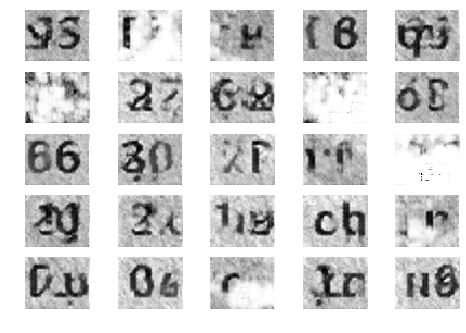

1701 [D loss: 0.432198, acc.: 76.56%] [G loss: 2.505791]
1702 [D loss: 0.367779, acc.: 85.94%] [G loss: 2.598142]
1703 [D loss: 0.411319, acc.: 79.69%] [G loss: 2.693617]
1704 [D loss: 0.237075, acc.: 95.31%] [G loss: 3.004447]
1705 [D loss: 0.327957, acc.: 85.94%] [G loss: 2.619295]
1706 [D loss: 0.591342, acc.: 73.44%] [G loss: 2.437513]
1707 [D loss: 0.410441, acc.: 79.69%] [G loss: 2.603167]
1708 [D loss: 0.622022, acc.: 67.19%] [G loss: 2.487947]
1709 [D loss: 0.503789, acc.: 73.44%] [G loss: 2.176162]
1710 [D loss: 0.615294, acc.: 75.00%] [G loss: 2.215996]
1711 [D loss: 0.349847, acc.: 82.81%] [G loss: 2.951823]
1712 [D loss: 0.362794, acc.: 85.94%] [G loss: 2.193814]
1713 [D loss: 0.543256, acc.: 73.44%] [G loss: 2.588325]
1714 [D loss: 0.411169, acc.: 81.25%] [G loss: 1.930313]
1715 [D loss: 0.227801, acc.: 92.19%] [G loss: 3.314476]
1716 [D loss: 0.362023, acc.: 79.69%] [G loss: 2.958376]
1717 [D loss: 0.384022, acc.: 84.38%] [G loss: 2.800952]
1718 [D loss: 0.294331, acc.: 8

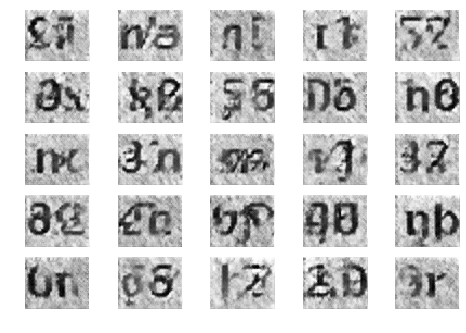

1751 [D loss: 0.456708, acc.: 81.25%] [G loss: 2.075096]
1752 [D loss: 0.408410, acc.: 78.12%] [G loss: 2.441106]
1753 [D loss: 0.487428, acc.: 71.88%] [G loss: 2.889941]
1754 [D loss: 0.404608, acc.: 82.81%] [G loss: 2.565335]
1755 [D loss: 0.159448, acc.: 96.88%] [G loss: 2.934830]
1756 [D loss: 0.101631, acc.: 98.44%] [G loss: 3.376590]
1757 [D loss: 0.079744, acc.: 100.00%] [G loss: 4.044697]
1758 [D loss: 0.125143, acc.: 96.88%] [G loss: 3.461092]
1759 [D loss: 0.725772, acc.: 68.75%] [G loss: 1.888050]
1760 [D loss: 0.702092, acc.: 59.38%] [G loss: 1.808960]
1761 [D loss: 0.489856, acc.: 81.25%] [G loss: 2.385168]
1762 [D loss: 0.197507, acc.: 96.88%] [G loss: 2.368439]
1763 [D loss: 0.671783, acc.: 73.44%] [G loss: 1.209276]
1764 [D loss: 0.479853, acc.: 75.00%] [G loss: 1.830022]
1765 [D loss: 0.223140, acc.: 93.75%] [G loss: 1.741166]
1766 [D loss: 0.655183, acc.: 71.88%] [G loss: 1.882956]
1767 [D loss: 0.292366, acc.: 89.06%] [G loss: 2.009108]
1768 [D loss: 0.478946, acc.: 

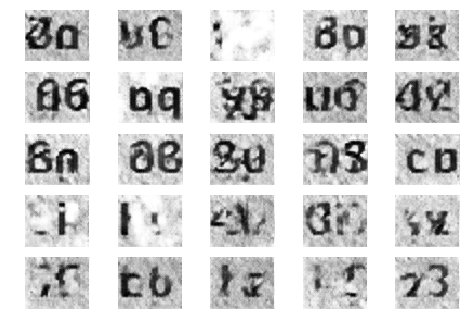

1801 [D loss: 0.241220, acc.: 92.19%] [G loss: 3.327657]
1802 [D loss: 0.765241, acc.: 54.69%] [G loss: 2.574965]
1803 [D loss: 0.171409, acc.: 95.31%] [G loss: 3.225366]
1804 [D loss: 0.566193, acc.: 70.31%] [G loss: 2.200928]
1805 [D loss: 0.389570, acc.: 81.25%] [G loss: 2.563533]
1806 [D loss: 0.615909, acc.: 71.88%] [G loss: 2.762072]
1807 [D loss: 0.316275, acc.: 89.06%] [G loss: 3.298104]
1808 [D loss: 0.284763, acc.: 81.25%] [G loss: 3.210539]
1809 [D loss: 0.213753, acc.: 92.19%] [G loss: 3.404043]
1810 [D loss: 0.150733, acc.: 95.31%] [G loss: 3.026808]
1811 [D loss: 0.594537, acc.: 71.88%] [G loss: 2.110554]
1812 [D loss: 0.461362, acc.: 75.00%] [G loss: 2.222012]
1813 [D loss: 0.377590, acc.: 84.38%] [G loss: 2.558872]
1814 [D loss: 0.111481, acc.: 98.44%] [G loss: 3.452865]
1815 [D loss: 0.815467, acc.: 65.62%] [G loss: 2.319264]
1816 [D loss: 0.288258, acc.: 85.94%] [G loss: 2.985844]
1817 [D loss: 0.573157, acc.: 68.75%] [G loss: 2.505822]
1818 [D loss: 0.118310, acc.: 1

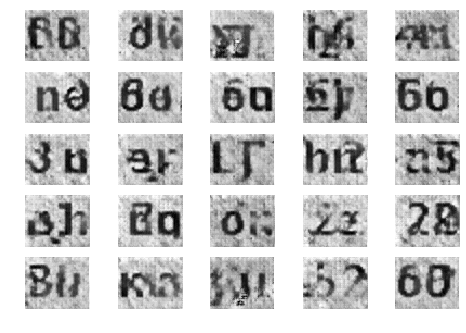

1851 [D loss: 0.728750, acc.: 57.81%] [G loss: 1.684844]
1852 [D loss: 0.246543, acc.: 90.62%] [G loss: 2.786143]
1853 [D loss: 0.501437, acc.: 73.44%] [G loss: 1.918231]
1854 [D loss: 0.416781, acc.: 81.25%] [G loss: 1.870795]
1855 [D loss: 0.446593, acc.: 76.56%] [G loss: 1.847939]
1856 [D loss: 0.410001, acc.: 87.50%] [G loss: 2.056324]
1857 [D loss: 0.517060, acc.: 79.69%] [G loss: 3.182559]
1858 [D loss: 0.352810, acc.: 85.94%] [G loss: 2.218817]
1859 [D loss: 0.464159, acc.: 71.88%] [G loss: 2.492421]
1860 [D loss: 0.589478, acc.: 70.31%] [G loss: 2.380210]
1861 [D loss: 0.449334, acc.: 79.69%] [G loss: 2.170217]
1862 [D loss: 0.632236, acc.: 70.31%] [G loss: 3.080083]
1863 [D loss: 0.426652, acc.: 79.69%] [G loss: 2.442932]
1864 [D loss: 0.167246, acc.: 96.88%] [G loss: 3.592590]
1865 [D loss: 0.399996, acc.: 76.56%] [G loss: 2.373344]
1866 [D loss: 0.590376, acc.: 67.19%] [G loss: 1.898048]
1867 [D loss: 0.428511, acc.: 82.81%] [G loss: 2.624404]
1868 [D loss: 0.649196, acc.: 6

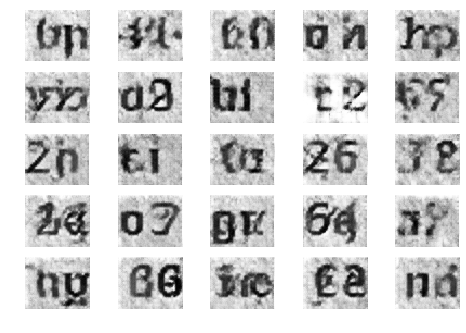

1901 [D loss: 0.298273, acc.: 87.50%] [G loss: 2.846800]
1902 [D loss: 0.194979, acc.: 92.19%] [G loss: 4.290923]
1903 [D loss: 0.729043, acc.: 71.88%] [G loss: 2.404649]
1904 [D loss: 0.336876, acc.: 82.81%] [G loss: 2.514323]
1905 [D loss: 0.447679, acc.: 78.12%] [G loss: 2.519120]
1906 [D loss: 0.180734, acc.: 93.75%] [G loss: 2.852804]
1907 [D loss: 0.328966, acc.: 87.50%] [G loss: 2.679207]
1908 [D loss: 0.160834, acc.: 95.31%] [G loss: 3.642480]
1909 [D loss: 0.185924, acc.: 96.88%] [G loss: 3.583570]
1910 [D loss: 0.423760, acc.: 82.81%] [G loss: 2.144797]
1911 [D loss: 0.448578, acc.: 78.12%] [G loss: 2.967566]
1912 [D loss: 0.348111, acc.: 84.38%] [G loss: 3.184436]
1913 [D loss: 0.568515, acc.: 70.31%] [G loss: 2.356583]
1914 [D loss: 0.213125, acc.: 89.06%] [G loss: 2.864313]
1915 [D loss: 0.339607, acc.: 87.50%] [G loss: 2.443789]
1916 [D loss: 0.161103, acc.: 95.31%] [G loss: 3.546397]
1917 [D loss: 0.188219, acc.: 96.88%] [G loss: 3.301024]
1918 [D loss: 0.108485, acc.: 9

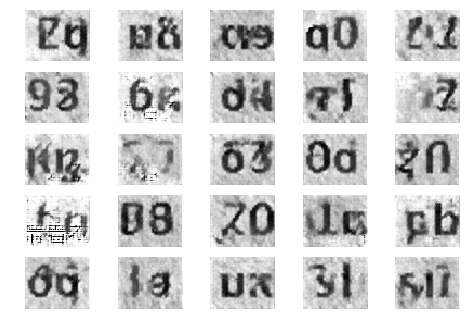

1951 [D loss: 0.636811, acc.: 68.75%] [G loss: 2.238699]
1952 [D loss: 0.601464, acc.: 68.75%] [G loss: 2.718499]
1953 [D loss: 0.615656, acc.: 71.88%] [G loss: 2.373040]
1954 [D loss: 0.414429, acc.: 78.12%] [G loss: 1.774697]
1955 [D loss: 0.402730, acc.: 81.25%] [G loss: 2.711278]
1956 [D loss: 0.591339, acc.: 68.75%] [G loss: 1.780050]
1957 [D loss: 0.381565, acc.: 79.69%] [G loss: 3.084649]
1958 [D loss: 0.521354, acc.: 73.44%] [G loss: 2.347404]
1959 [D loss: 0.665118, acc.: 67.19%] [G loss: 1.603177]
1960 [D loss: 0.433558, acc.: 82.81%] [G loss: 2.663886]
1961 [D loss: 0.407569, acc.: 82.81%] [G loss: 2.237091]
1962 [D loss: 0.383858, acc.: 81.25%] [G loss: 2.781673]
1963 [D loss: 0.642190, acc.: 67.19%] [G loss: 2.121200]
1964 [D loss: 0.313922, acc.: 90.62%] [G loss: 3.438256]
1965 [D loss: 0.234902, acc.: 92.19%] [G loss: 3.163779]
1966 [D loss: 0.414574, acc.: 84.38%] [G loss: 2.114225]
1967 [D loss: 0.375420, acc.: 85.94%] [G loss: 2.088831]
1968 [D loss: 0.402794, acc.: 8

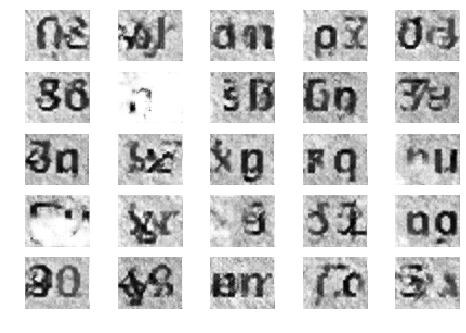

2001 [D loss: 0.236693, acc.: 93.75%] [G loss: 2.982585]
2002 [D loss: 0.767425, acc.: 64.06%] [G loss: 2.260959]
2003 [D loss: 0.231094, acc.: 95.31%] [G loss: 3.196687]
2004 [D loss: 0.311235, acc.: 87.50%] [G loss: 2.617116]
2005 [D loss: 0.489614, acc.: 73.44%] [G loss: 2.109976]
2006 [D loss: 0.322383, acc.: 89.06%] [G loss: 2.744350]
2007 [D loss: 0.242842, acc.: 89.06%] [G loss: 3.604724]
2008 [D loss: 0.196218, acc.: 93.75%] [G loss: 3.207679]
2009 [D loss: 0.476666, acc.: 76.56%] [G loss: 3.150222]
2010 [D loss: 0.239628, acc.: 87.50%] [G loss: 3.636394]
2011 [D loss: 0.151156, acc.: 96.88%] [G loss: 4.082555]
2012 [D loss: 0.909352, acc.: 60.94%] [G loss: 1.481956]
2013 [D loss: 0.617845, acc.: 67.19%] [G loss: 2.504012]
2014 [D loss: 0.138765, acc.: 98.44%] [G loss: 4.888265]
2015 [D loss: 0.141259, acc.: 96.88%] [G loss: 4.101603]
2016 [D loss: 0.276671, acc.: 89.06%] [G loss: 3.255961]
2017 [D loss: 0.165768, acc.: 95.31%] [G loss: 3.242580]
2018 [D loss: 0.734315, acc.: 6

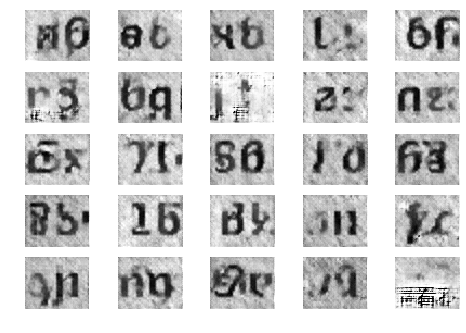

2051 [D loss: 0.556342, acc.: 79.69%] [G loss: 2.238841]
2052 [D loss: 0.460611, acc.: 76.56%] [G loss: 1.729289]
2053 [D loss: 0.534970, acc.: 79.69%] [G loss: 2.205476]
2054 [D loss: 0.887021, acc.: 45.31%] [G loss: 1.562959]
2055 [D loss: 0.427576, acc.: 78.12%] [G loss: 1.905941]
2056 [D loss: 0.455778, acc.: 81.25%] [G loss: 3.065156]
2057 [D loss: 0.424292, acc.: 84.38%] [G loss: 3.076610]
2058 [D loss: 0.425343, acc.: 79.69%] [G loss: 3.242409]
2059 [D loss: 0.359505, acc.: 84.38%] [G loss: 2.116872]
2060 [D loss: 0.322692, acc.: 85.94%] [G loss: 2.785352]
2061 [D loss: 0.236275, acc.: 93.75%] [G loss: 3.127978]
2062 [D loss: 0.598535, acc.: 64.06%] [G loss: 3.119478]
2063 [D loss: 0.225037, acc.: 92.19%] [G loss: 3.195596]
2064 [D loss: 0.802195, acc.: 70.31%] [G loss: 1.803769]
2065 [D loss: 0.245404, acc.: 92.19%] [G loss: 3.230069]
2066 [D loss: 0.455431, acc.: 75.00%] [G loss: 3.230190]
2067 [D loss: 0.345900, acc.: 85.94%] [G loss: 2.350149]
2068 [D loss: 0.367357, acc.: 7

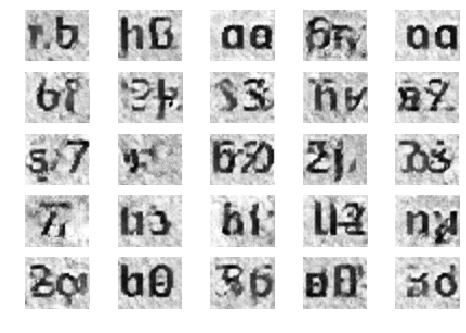

2101 [D loss: 0.316301, acc.: 87.50%] [G loss: 2.412992]
2102 [D loss: 0.085110, acc.: 98.44%] [G loss: 3.921566]
2103 [D loss: 0.646382, acc.: 73.44%] [G loss: 2.516681]
2104 [D loss: 0.396798, acc.: 82.81%] [G loss: 2.319865]
2105 [D loss: 0.295492, acc.: 90.62%] [G loss: 3.080441]
2106 [D loss: 0.174565, acc.: 93.75%] [G loss: 3.558261]
2107 [D loss: 0.538754, acc.: 73.44%] [G loss: 2.433105]
2108 [D loss: 0.308984, acc.: 85.94%] [G loss: 3.145767]
2109 [D loss: 0.316201, acc.: 85.94%] [G loss: 3.567288]
2110 [D loss: 0.603868, acc.: 67.19%] [G loss: 2.598444]
2111 [D loss: 0.449332, acc.: 78.12%] [G loss: 2.233574]
2112 [D loss: 0.261801, acc.: 92.19%] [G loss: 3.175751]
2113 [D loss: 0.214328, acc.: 95.31%] [G loss: 3.742307]
2114 [D loss: 0.112607, acc.: 98.44%] [G loss: 3.576838]
2115 [D loss: 0.504969, acc.: 76.56%] [G loss: 2.401341]
2116 [D loss: 0.195921, acc.: 92.19%] [G loss: 3.305073]
2117 [D loss: 0.369607, acc.: 87.50%] [G loss: 2.458823]
2118 [D loss: 0.586324, acc.: 7

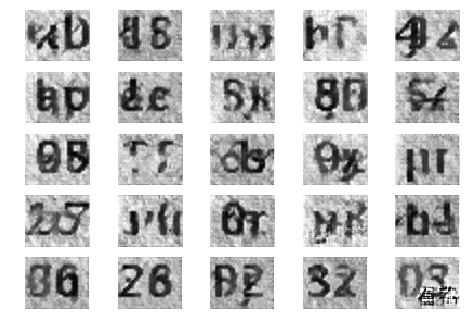

2151 [D loss: 0.379785, acc.: 79.69%] [G loss: 2.320609]
2152 [D loss: 0.148270, acc.: 96.88%] [G loss: 2.092775]
2153 [D loss: 0.478976, acc.: 81.25%] [G loss: 1.890348]
2154 [D loss: 0.313346, acc.: 89.06%] [G loss: 3.170537]
2155 [D loss: 0.315969, acc.: 85.94%] [G loss: 3.417325]
2156 [D loss: 0.474038, acc.: 79.69%] [G loss: 2.660619]
2157 [D loss: 0.125983, acc.: 98.44%] [G loss: 1.900248]
2158 [D loss: 0.242802, acc.: 92.19%] [G loss: 3.872518]
2159 [D loss: 0.094968, acc.: 98.44%] [G loss: 2.443180]
2160 [D loss: 0.242225, acc.: 90.62%] [G loss: 2.487920]
2161 [D loss: 0.323477, acc.: 85.94%] [G loss: 2.173540]
2162 [D loss: 0.297075, acc.: 87.50%] [G loss: 2.359082]
2163 [D loss: 0.293200, acc.: 89.06%] [G loss: 2.340055]
2164 [D loss: 0.243958, acc.: 93.75%] [G loss: 2.363502]
2165 [D loss: 0.801698, acc.: 53.12%] [G loss: 1.917294]
2166 [D loss: 0.306621, acc.: 84.38%] [G loss: 2.586841]
2167 [D loss: 0.176010, acc.: 96.88%] [G loss: 2.802150]
2168 [D loss: 0.325182, acc.: 8

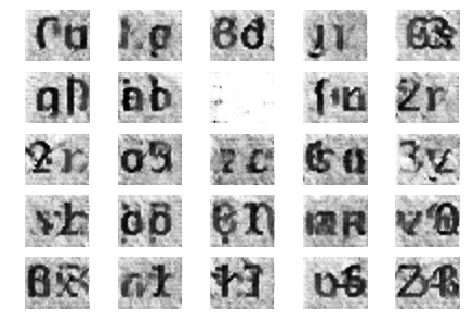

2201 [D loss: 0.229357, acc.: 92.19%] [G loss: 2.704170]
2202 [D loss: 0.246561, acc.: 90.62%] [G loss: 3.057515]
2203 [D loss: 0.229556, acc.: 89.06%] [G loss: 3.274855]
2204 [D loss: 0.108527, acc.: 98.44%] [G loss: 3.061791]
2205 [D loss: 0.424849, acc.: 82.81%] [G loss: 2.463416]
2206 [D loss: 0.322341, acc.: 87.50%] [G loss: 2.383019]
2207 [D loss: 0.208981, acc.: 95.31%] [G loss: 3.217536]
2208 [D loss: 0.626504, acc.: 71.88%] [G loss: 2.991148]
2209 [D loss: 0.427653, acc.: 81.25%] [G loss: 2.215224]
2210 [D loss: 0.123100, acc.: 98.44%] [G loss: 2.584881]
2211 [D loss: 0.381191, acc.: 87.50%] [G loss: 2.668700]
2212 [D loss: 0.252800, acc.: 93.75%] [G loss: 3.126896]
2213 [D loss: 0.535318, acc.: 75.00%] [G loss: 3.159616]
2214 [D loss: 0.410471, acc.: 84.38%] [G loss: 2.955562]
2215 [D loss: 0.254656, acc.: 90.62%] [G loss: 2.535289]
2216 [D loss: 0.574532, acc.: 75.00%] [G loss: 3.291089]
2217 [D loss: 0.205434, acc.: 90.62%] [G loss: 3.684098]
2218 [D loss: 0.164669, acc.: 9

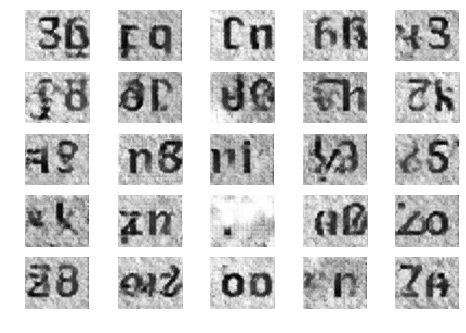

2251 [D loss: 0.508436, acc.: 78.12%] [G loss: 3.096496]
2252 [D loss: 0.455595, acc.: 79.69%] [G loss: 2.835032]
2253 [D loss: 0.588490, acc.: 70.31%] [G loss: 2.242065]
2254 [D loss: 0.521189, acc.: 78.12%] [G loss: 3.069229]
2255 [D loss: 0.197632, acc.: 95.31%] [G loss: 4.063323]
2256 [D loss: 0.397274, acc.: 81.25%] [G loss: 2.649701]
2257 [D loss: 0.373847, acc.: 92.19%] [G loss: 2.435185]
2258 [D loss: 0.325888, acc.: 84.38%] [G loss: 2.889183]
2259 [D loss: 0.150774, acc.: 95.31%] [G loss: 3.808209]
2260 [D loss: 0.383644, acc.: 78.12%] [G loss: 2.910962]
2261 [D loss: 0.476245, acc.: 73.44%] [G loss: 2.730276]
2262 [D loss: 0.542109, acc.: 73.44%] [G loss: 2.303921]
2263 [D loss: 0.376106, acc.: 79.69%] [G loss: 2.625524]
2264 [D loss: 0.102222, acc.: 96.88%] [G loss: 3.828138]
2265 [D loss: 0.725517, acc.: 65.62%] [G loss: 2.037632]
2266 [D loss: 0.399590, acc.: 84.38%] [G loss: 3.416192]
2267 [D loss: 0.082850, acc.: 98.44%] [G loss: 3.972078]
2268 [D loss: 0.104161, acc.: 9

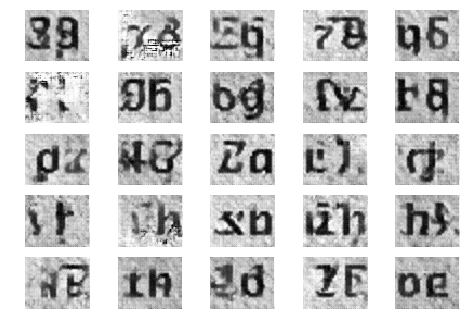

2301 [D loss: 0.138718, acc.: 96.88%] [G loss: 2.903717]
2302 [D loss: 0.520745, acc.: 75.00%] [G loss: 0.995695]
2303 [D loss: 0.601857, acc.: 73.44%] [G loss: 2.140045]
2304 [D loss: 0.464943, acc.: 81.25%] [G loss: 2.229832]
2305 [D loss: 0.277785, acc.: 89.06%] [G loss: 2.537224]
2306 [D loss: 0.405406, acc.: 82.81%] [G loss: 2.051723]
2307 [D loss: 0.391701, acc.: 81.25%] [G loss: 1.540407]
2308 [D loss: 0.348670, acc.: 87.50%] [G loss: 2.861069]
2309 [D loss: 0.172593, acc.: 95.31%] [G loss: 2.890345]
2310 [D loss: 0.418491, acc.: 82.81%] [G loss: 3.071638]
2311 [D loss: 0.294772, acc.: 82.81%] [G loss: 3.119736]
2312 [D loss: 0.311311, acc.: 90.62%] [G loss: 2.937965]
2313 [D loss: 0.236982, acc.: 95.31%] [G loss: 2.524528]
2314 [D loss: 0.457523, acc.: 79.69%] [G loss: 2.299310]
2315 [D loss: 0.255266, acc.: 92.19%] [G loss: 2.200547]
2316 [D loss: 0.377741, acc.: 84.38%] [G loss: 2.879899]
2317 [D loss: 0.198742, acc.: 93.75%] [G loss: 3.336369]
2318 [D loss: 0.277938, acc.: 8

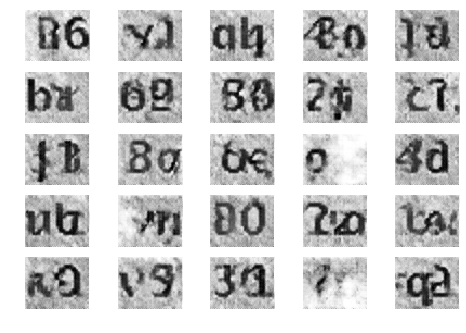

2351 [D loss: 0.347645, acc.: 84.38%] [G loss: 3.302271]
2352 [D loss: 0.340045, acc.: 81.25%] [G loss: 2.970288]
2353 [D loss: 0.219012, acc.: 89.06%] [G loss: 4.113719]
2354 [D loss: 0.100763, acc.: 100.00%] [G loss: 3.925113]
2355 [D loss: 0.495492, acc.: 75.00%] [G loss: 2.567758]
2356 [D loss: 0.333643, acc.: 82.81%] [G loss: 2.903231]
2357 [D loss: 0.202157, acc.: 90.62%] [G loss: 2.807866]
2358 [D loss: 0.246597, acc.: 90.62%] [G loss: 3.881181]
2359 [D loss: 0.507986, acc.: 68.75%] [G loss: 2.811090]
2360 [D loss: 0.419009, acc.: 78.12%] [G loss: 3.336751]
2361 [D loss: 0.083788, acc.: 100.00%] [G loss: 4.485646]
2362 [D loss: 0.180384, acc.: 95.31%] [G loss: 4.044082]
2363 [D loss: 0.619588, acc.: 59.38%] [G loss: 2.465031]
2364 [D loss: 0.276209, acc.: 93.75%] [G loss: 3.497855]
2365 [D loss: 0.375699, acc.: 81.25%] [G loss: 3.590585]
2366 [D loss: 0.109773, acc.: 96.88%] [G loss: 4.555384]
2367 [D loss: 0.656906, acc.: 70.31%] [G loss: 2.516658]
2368 [D loss: 0.277538, acc.:

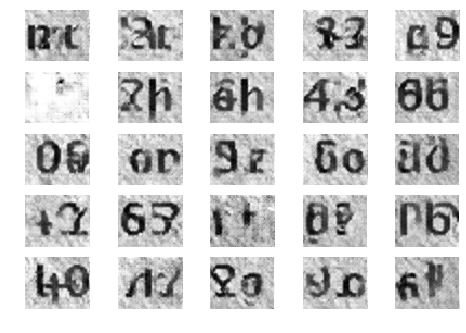

2401 [D loss: 0.084939, acc.: 100.00%] [G loss: 3.239686]
2402 [D loss: 0.097530, acc.: 98.44%] [G loss: 4.057540]
2403 [D loss: 0.445179, acc.: 70.31%] [G loss: 2.288215]
2404 [D loss: 0.081967, acc.: 100.00%] [G loss: 3.220734]
2405 [D loss: 0.090829, acc.: 98.44%] [G loss: 4.635038]
2406 [D loss: 0.101720, acc.: 98.44%] [G loss: 4.499819]
2407 [D loss: 0.113068, acc.: 96.88%] [G loss: 4.796205]
2408 [D loss: 0.094469, acc.: 98.44%] [G loss: 4.770023]
2409 [D loss: 0.035641, acc.: 100.00%] [G loss: 4.396091]
2410 [D loss: 0.132936, acc.: 95.31%] [G loss: 4.332435]
2411 [D loss: 0.606989, acc.: 71.88%] [G loss: 2.216603]
2412 [D loss: 0.320541, acc.: 89.06%] [G loss: 3.257206]
2413 [D loss: 0.361611, acc.: 82.81%] [G loss: 3.278579]
2414 [D loss: 0.094478, acc.: 93.75%] [G loss: 3.734200]
2415 [D loss: 0.094279, acc.: 96.88%] [G loss: 4.438853]
2416 [D loss: 0.784286, acc.: 62.50%] [G loss: 2.610578]
2417 [D loss: 0.122960, acc.: 95.31%] [G loss: 2.980829]
2418 [D loss: 0.185510, acc.

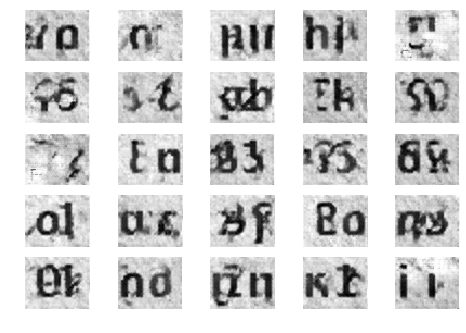

2451 [D loss: 0.499593, acc.: 76.56%] [G loss: 2.868269]
2452 [D loss: 0.332883, acc.: 89.06%] [G loss: 2.347763]
2453 [D loss: 0.246989, acc.: 92.19%] [G loss: 3.437474]
2454 [D loss: 0.260859, acc.: 93.75%] [G loss: 2.729268]
2455 [D loss: 0.372655, acc.: 81.25%] [G loss: 2.310524]
2456 [D loss: 0.260232, acc.: 87.50%] [G loss: 3.273767]
2457 [D loss: 0.410828, acc.: 79.69%] [G loss: 4.623341]
2458 [D loss: 0.466506, acc.: 79.69%] [G loss: 3.339385]
2459 [D loss: 0.606644, acc.: 68.75%] [G loss: 3.752299]
2460 [D loss: 0.397341, acc.: 78.12%] [G loss: 3.166267]
2461 [D loss: 0.653425, acc.: 76.56%] [G loss: 2.348727]
2462 [D loss: 0.214497, acc.: 90.62%] [G loss: 3.950071]
2463 [D loss: 0.267115, acc.: 85.94%] [G loss: 3.947581]
2464 [D loss: 0.156543, acc.: 98.44%] [G loss: 4.189624]
2465 [D loss: 0.487410, acc.: 78.12%] [G loss: 2.637517]
2466 [D loss: 0.266546, acc.: 85.94%] [G loss: 3.646476]
2467 [D loss: 0.513265, acc.: 73.44%] [G loss: 2.476421]
2468 [D loss: 0.337437, acc.: 8

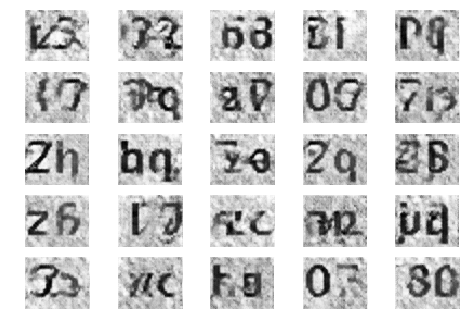

2501 [D loss: 0.072785, acc.: 96.88%] [G loss: 3.784535]
2502 [D loss: 0.664064, acc.: 76.56%] [G loss: 2.634674]
2503 [D loss: 0.147750, acc.: 95.31%] [G loss: 3.400698]
2504 [D loss: 0.452821, acc.: 76.56%] [G loss: 2.547281]
2505 [D loss: 0.169281, acc.: 93.75%] [G loss: 3.558563]
2506 [D loss: 0.332859, acc.: 82.81%] [G loss: 2.479314]
2507 [D loss: 0.404558, acc.: 78.12%] [G loss: 3.262771]
2508 [D loss: 0.077817, acc.: 96.88%] [G loss: 4.833567]
2509 [D loss: 0.567228, acc.: 75.00%] [G loss: 3.014043]
2510 [D loss: 0.391988, acc.: 82.81%] [G loss: 2.901811]
2511 [D loss: 0.084744, acc.: 98.44%] [G loss: 4.277597]
2512 [D loss: 0.420696, acc.: 81.25%] [G loss: 2.179949]
2513 [D loss: 0.311379, acc.: 85.94%] [G loss: 2.837968]
2514 [D loss: 0.066709, acc.: 98.44%] [G loss: 4.012195]
2515 [D loss: 0.061533, acc.: 100.00%] [G loss: 4.424586]
2516 [D loss: 0.074151, acc.: 96.88%] [G loss: 5.065154]
2517 [D loss: 0.097408, acc.: 98.44%] [G loss: 4.698408]
2518 [D loss: 0.498915, acc.: 

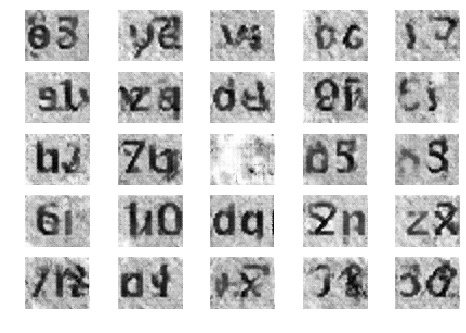

2551 [D loss: 0.052506, acc.: 98.44%] [G loss: 4.426667]
2552 [D loss: 0.648711, acc.: 65.62%] [G loss: 2.841886]
2553 [D loss: 0.366264, acc.: 78.12%] [G loss: 1.954460]
2554 [D loss: 0.067547, acc.: 100.00%] [G loss: 3.444013]
2555 [D loss: 0.944047, acc.: 57.81%] [G loss: 1.033431]
2556 [D loss: 0.788894, acc.: 64.06%] [G loss: 2.169407]
2557 [D loss: 0.337044, acc.: 87.50%] [G loss: 2.390232]
2558 [D loss: 0.517820, acc.: 71.88%] [G loss: 3.346795]
2559 [D loss: 0.204921, acc.: 89.06%] [G loss: 3.347670]
2560 [D loss: 0.400902, acc.: 81.25%] [G loss: 3.217656]
2561 [D loss: 0.250983, acc.: 92.19%] [G loss: 2.188842]
2562 [D loss: 0.478112, acc.: 81.25%] [G loss: 2.453719]
2563 [D loss: 0.209815, acc.: 89.06%] [G loss: 3.732455]
2564 [D loss: 0.370202, acc.: 84.38%] [G loss: 2.690643]
2565 [D loss: 0.625218, acc.: 73.44%] [G loss: 2.560905]
2566 [D loss: 0.340945, acc.: 87.50%] [G loss: 2.506032]
2567 [D loss: 0.220398, acc.: 89.06%] [G loss: 3.914963]
2568 [D loss: 0.428274, acc.: 

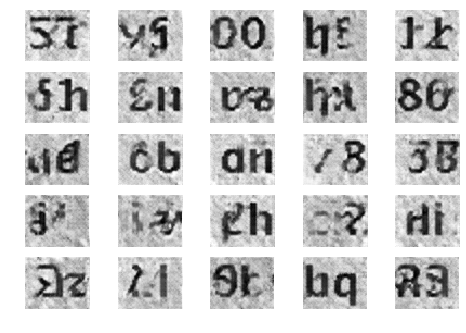

2601 [D loss: 0.176314, acc.: 92.19%] [G loss: 3.199269]
2602 [D loss: 0.069045, acc.: 100.00%] [G loss: 4.723314]
2603 [D loss: 0.187550, acc.: 92.19%] [G loss: 3.449791]
2604 [D loss: 0.297253, acc.: 89.06%] [G loss: 2.529866]
2605 [D loss: 0.276965, acc.: 84.38%] [G loss: 3.231946]
2606 [D loss: 0.346368, acc.: 79.69%] [G loss: 3.676765]
2607 [D loss: 0.066345, acc.: 100.00%] [G loss: 4.547582]
2608 [D loss: 0.096930, acc.: 98.44%] [G loss: 5.066308]
2609 [D loss: 0.065745, acc.: 100.00%] [G loss: 4.716414]
2610 [D loss: 0.336331, acc.: 85.94%] [G loss: 2.753544]
2611 [D loss: 0.283262, acc.: 87.50%] [G loss: 3.057297]
2612 [D loss: 0.085137, acc.: 98.44%] [G loss: 3.829811]
2613 [D loss: 0.182087, acc.: 95.31%] [G loss: 3.552994]
2614 [D loss: 0.528041, acc.: 81.25%] [G loss: 2.741032]
2615 [D loss: 0.401390, acc.: 76.56%] [G loss: 3.300608]
2616 [D loss: 0.090205, acc.: 100.00%] [G loss: 4.582713]
2617 [D loss: 0.480006, acc.: 78.12%] [G loss: 2.961215]
2618 [D loss: 0.350055, acc

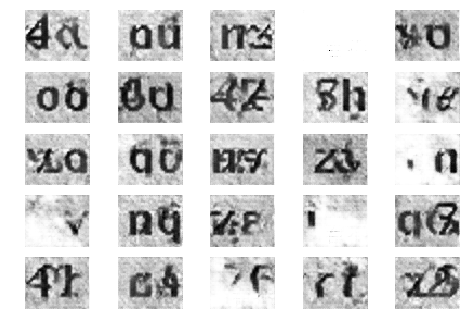

2651 [D loss: 0.333348, acc.: 82.81%] [G loss: 3.906910]
2652 [D loss: 0.594129, acc.: 75.00%] [G loss: 3.528114]
2653 [D loss: 0.215273, acc.: 95.31%] [G loss: 3.974998]
2654 [D loss: 0.347265, acc.: 82.81%] [G loss: 4.034748]
2655 [D loss: 0.149425, acc.: 95.31%] [G loss: 3.673211]
2656 [D loss: 0.369134, acc.: 84.38%] [G loss: 2.563162]
2657 [D loss: 0.436843, acc.: 81.25%] [G loss: 3.358409]
2658 [D loss: 0.333885, acc.: 82.81%] [G loss: 3.033811]
2659 [D loss: 0.273407, acc.: 92.19%] [G loss: 3.404319]
2660 [D loss: 0.141446, acc.: 95.31%] [G loss: 4.575257]
2661 [D loss: 0.409834, acc.: 76.56%] [G loss: 3.487006]
2662 [D loss: 0.312950, acc.: 85.94%] [G loss: 3.452267]
2663 [D loss: 0.107151, acc.: 98.44%] [G loss: 5.297559]
2664 [D loss: 0.082370, acc.: 100.00%] [G loss: 3.690640]
2665 [D loss: 0.457638, acc.: 76.56%] [G loss: 3.061865]
2666 [D loss: 0.406325, acc.: 82.81%] [G loss: 3.253551]
2667 [D loss: 0.236643, acc.: 89.06%] [G loss: 4.078969]
2668 [D loss: 0.358905, acc.: 

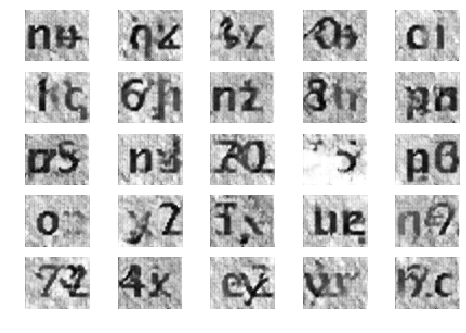

2701 [D loss: 0.366357, acc.: 87.50%] [G loss: 2.667820]
2702 [D loss: 0.182406, acc.: 93.75%] [G loss: 3.566636]
2703 [D loss: 0.404921, acc.: 76.56%] [G loss: 4.156183]
2704 [D loss: 0.100867, acc.: 96.88%] [G loss: 5.104419]
2705 [D loss: 0.861834, acc.: 71.88%] [G loss: 2.682236]
2706 [D loss: 0.270638, acc.: 87.50%] [G loss: 3.688150]
2707 [D loss: 0.070617, acc.: 98.44%] [G loss: 4.317476]
2708 [D loss: 0.321174, acc.: 82.81%] [G loss: 3.005228]
2709 [D loss: 0.084768, acc.: 98.44%] [G loss: 3.985604]
2710 [D loss: 0.604993, acc.: 71.88%] [G loss: 3.539940]
2711 [D loss: 0.212867, acc.: 90.62%] [G loss: 3.593951]
2712 [D loss: 0.072940, acc.: 98.44%] [G loss: 4.414117]
2713 [D loss: 0.423294, acc.: 90.62%] [G loss: 4.006449]
2714 [D loss: 0.085894, acc.: 96.88%] [G loss: 4.818188]
2715 [D loss: 0.040333, acc.: 100.00%] [G loss: 4.644697]
2716 [D loss: 0.766447, acc.: 62.50%] [G loss: 3.102876]
2717 [D loss: 0.190964, acc.: 89.06%] [G loss: 3.462454]
2718 [D loss: 0.060471, acc.: 

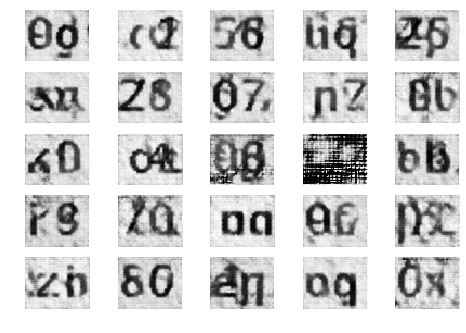

2751 [D loss: 0.300527, acc.: 84.38%] [G loss: 2.675403]
2752 [D loss: 0.094135, acc.: 98.44%] [G loss: 4.157655]
2753 [D loss: 0.137907, acc.: 98.44%] [G loss: 3.377366]
2754 [D loss: 0.602167, acc.: 70.31%] [G loss: 2.197889]
2755 [D loss: 0.135605, acc.: 95.31%] [G loss: 3.834298]
2756 [D loss: 0.251182, acc.: 92.19%] [G loss: 2.697240]
2757 [D loss: 0.117849, acc.: 96.88%] [G loss: 2.526024]
2758 [D loss: 0.394305, acc.: 85.94%] [G loss: 2.119758]
2759 [D loss: 0.163067, acc.: 90.62%] [G loss: 1.731362]
2760 [D loss: 0.342202, acc.: 85.94%] [G loss: 3.349648]
2761 [D loss: 0.170992, acc.: 96.88%] [G loss: 3.180971]
2762 [D loss: 0.157186, acc.: 95.31%] [G loss: 3.325281]
2763 [D loss: 0.163158, acc.: 95.31%] [G loss: 2.766274]
2764 [D loss: 0.179108, acc.: 93.75%] [G loss: 4.115018]
2765 [D loss: 0.451527, acc.: 79.69%] [G loss: 3.130607]
2766 [D loss: 0.235166, acc.: 92.19%] [G loss: 2.729844]
2767 [D loss: 0.501414, acc.: 76.56%] [G loss: 1.827988]
2768 [D loss: 0.370841, acc.: 8

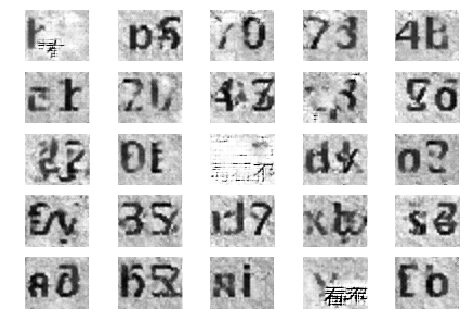

2801 [D loss: 0.224996, acc.: 92.19%] [G loss: 3.965315]
2802 [D loss: 0.482740, acc.: 82.81%] [G loss: 2.615707]
2803 [D loss: 0.414872, acc.: 85.94%] [G loss: 2.133698]
2804 [D loss: 0.157011, acc.: 96.88%] [G loss: 3.285400]
2805 [D loss: 0.298178, acc.: 93.75%] [G loss: 3.835006]
2806 [D loss: 0.192384, acc.: 92.19%] [G loss: 2.987036]
2807 [D loss: 0.339767, acc.: 85.94%] [G loss: 2.574940]
2808 [D loss: 0.381942, acc.: 82.81%] [G loss: 3.040006]
2809 [D loss: 0.300859, acc.: 89.06%] [G loss: 2.857697]
2810 [D loss: 0.524486, acc.: 82.81%] [G loss: 3.293832]
2811 [D loss: 0.651375, acc.: 67.19%] [G loss: 3.086931]
2812 [D loss: 0.521902, acc.: 81.25%] [G loss: 3.082662]
2813 [D loss: 0.228040, acc.: 89.06%] [G loss: 3.267336]
2814 [D loss: 0.304746, acc.: 84.38%] [G loss: 2.250772]
2815 [D loss: 0.587254, acc.: 75.00%] [G loss: 3.483831]
2816 [D loss: 0.223430, acc.: 92.19%] [G loss: 2.606586]
2817 [D loss: 0.198646, acc.: 92.19%] [G loss: 3.769335]
2818 [D loss: 0.400420, acc.: 7

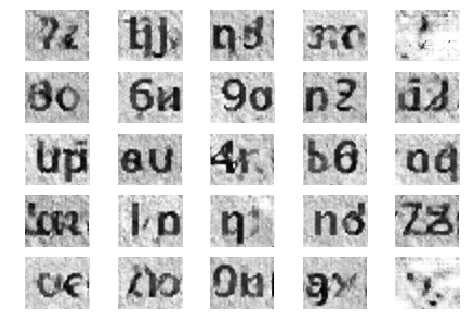

2851 [D loss: 0.473409, acc.: 75.00%] [G loss: 3.715547]
2852 [D loss: 0.208404, acc.: 89.06%] [G loss: 3.328010]
2853 [D loss: 0.075726, acc.: 98.44%] [G loss: 3.660492]
2854 [D loss: 0.121487, acc.: 95.31%] [G loss: 4.503687]
2855 [D loss: 0.311638, acc.: 90.62%] [G loss: 2.538879]
2856 [D loss: 0.329146, acc.: 87.50%] [G loss: 2.047642]
2857 [D loss: 0.149163, acc.: 96.88%] [G loss: 3.813278]
2858 [D loss: 0.072898, acc.: 96.88%] [G loss: 4.819022]
2859 [D loss: 0.597621, acc.: 70.31%] [G loss: 2.380037]
2860 [D loss: 0.517407, acc.: 78.12%] [G loss: 2.934085]
2861 [D loss: 0.189831, acc.: 89.06%] [G loss: 4.403937]
2862 [D loss: 0.478464, acc.: 73.44%] [G loss: 3.201185]
2863 [D loss: 0.448649, acc.: 75.00%] [G loss: 2.268393]
2864 [D loss: 0.080412, acc.: 98.44%] [G loss: 3.038801]
2865 [D loss: 0.150670, acc.: 93.75%] [G loss: 2.962881]
2866 [D loss: 0.594335, acc.: 68.75%] [G loss: 1.855741]
2867 [D loss: 1.086412, acc.: 59.38%] [G loss: 2.934743]
2868 [D loss: 0.098500, acc.: 9

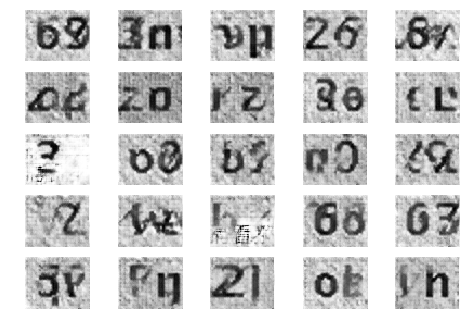

2901 [D loss: 0.135619, acc.: 95.31%] [G loss: 3.878455]
2902 [D loss: 0.245346, acc.: 95.31%] [G loss: 2.722045]
2903 [D loss: 0.219036, acc.: 92.19%] [G loss: 2.711062]
2904 [D loss: 0.762475, acc.: 67.19%] [G loss: 2.300817]
2905 [D loss: 0.204700, acc.: 90.62%] [G loss: 2.724833]
2906 [D loss: 0.144765, acc.: 96.88%] [G loss: 3.414675]
2907 [D loss: 0.228699, acc.: 89.06%] [G loss: 3.249730]
2908 [D loss: 0.253788, acc.: 89.06%] [G loss: 5.241444]
2909 [D loss: 0.416384, acc.: 82.81%] [G loss: 3.247293]
2910 [D loss: 0.730439, acc.: 68.75%] [G loss: 1.498857]
2911 [D loss: 0.257727, acc.: 89.06%] [G loss: 3.845306]
2912 [D loss: 0.337915, acc.: 89.06%] [G loss: 4.033188]
2913 [D loss: 0.251339, acc.: 92.19%] [G loss: 3.080943]
2914 [D loss: 0.201585, acc.: 95.31%] [G loss: 2.663737]
2915 [D loss: 0.314896, acc.: 82.81%] [G loss: 2.106590]
2916 [D loss: 0.347792, acc.: 85.94%] [G loss: 2.894957]
2917 [D loss: 0.262850, acc.: 92.19%] [G loss: 2.995008]
2918 [D loss: 0.265253, acc.: 9

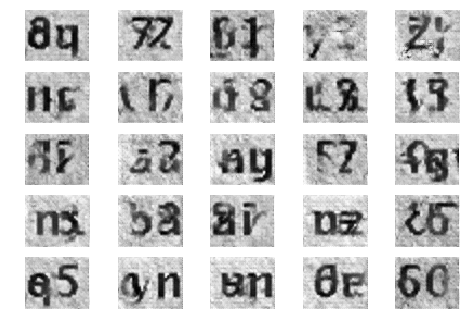

2951 [D loss: 0.198310, acc.: 95.31%] [G loss: 2.240799]
2952 [D loss: 0.261923, acc.: 90.62%] [G loss: 2.473308]
2953 [D loss: 0.577670, acc.: 71.88%] [G loss: 3.552632]
2954 [D loss: 0.352837, acc.: 90.62%] [G loss: 4.981924]
2955 [D loss: 0.295405, acc.: 84.38%] [G loss: 3.228677]
2956 [D loss: 0.190624, acc.: 92.19%] [G loss: 2.706414]
2957 [D loss: 0.212336, acc.: 93.75%] [G loss: 4.347439]
2958 [D loss: 0.672006, acc.: 71.88%] [G loss: 3.134789]
2959 [D loss: 0.352347, acc.: 79.69%] [G loss: 3.714092]
2960 [D loss: 0.188955, acc.: 92.19%] [G loss: 5.141419]
2961 [D loss: 0.665135, acc.: 65.62%] [G loss: 2.707620]
2962 [D loss: 0.134819, acc.: 95.31%] [G loss: 4.371263]
2963 [D loss: 0.247592, acc.: 92.19%] [G loss: 3.801034]
2964 [D loss: 0.187127, acc.: 92.19%] [G loss: 3.416474]
2965 [D loss: 0.613325, acc.: 71.88%] [G loss: 3.324812]
2966 [D loss: 0.166297, acc.: 95.31%] [G loss: 3.380535]
2967 [D loss: 0.512315, acc.: 71.88%] [G loss: 3.871552]
2968 [D loss: 0.107422, acc.: 9

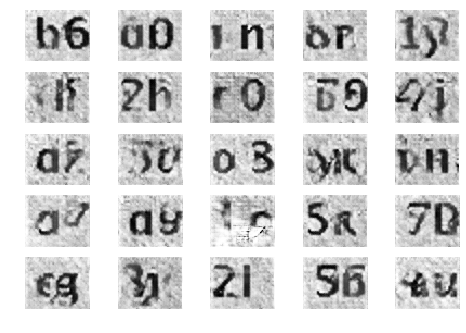

3001 [D loss: 0.291674, acc.: 87.50%] [G loss: 3.400248]
3002 [D loss: 0.362132, acc.: 81.25%] [G loss: 3.521719]
3003 [D loss: 0.130468, acc.: 100.00%] [G loss: 3.420128]
3004 [D loss: 0.390318, acc.: 85.94%] [G loss: 2.801459]
3005 [D loss: 0.461944, acc.: 82.81%] [G loss: 3.727333]
3006 [D loss: 0.255209, acc.: 89.06%] [G loss: 3.560690]
3007 [D loss: 0.299357, acc.: 84.38%] [G loss: 3.451758]
3008 [D loss: 0.432436, acc.: 78.12%] [G loss: 2.587295]
3009 [D loss: 0.242145, acc.: 90.62%] [G loss: 3.647325]
3010 [D loss: 0.178148, acc.: 93.75%] [G loss: 3.237997]
3011 [D loss: 0.229692, acc.: 89.06%] [G loss: 3.658754]
3012 [D loss: 0.208043, acc.: 89.06%] [G loss: 4.090057]
3013 [D loss: 0.218057, acc.: 93.75%] [G loss: 3.858458]
3014 [D loss: 0.498543, acc.: 78.12%] [G loss: 3.876761]
3015 [D loss: 0.092942, acc.: 98.44%] [G loss: 3.053245]
3016 [D loss: 0.331040, acc.: 82.81%] [G loss: 2.366542]
3017 [D loss: 0.239245, acc.: 89.06%] [G loss: 3.514799]
3018 [D loss: 0.200673, acc.: 

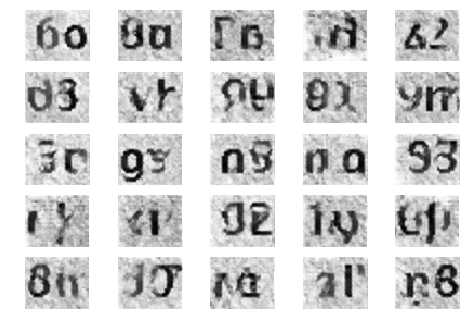

3051 [D loss: 0.256155, acc.: 87.50%] [G loss: 4.304936]
3052 [D loss: 0.476425, acc.: 76.56%] [G loss: 3.665715]
3053 [D loss: 0.176459, acc.: 96.88%] [G loss: 4.256493]
3054 [D loss: 0.120142, acc.: 95.31%] [G loss: 4.494525]
3055 [D loss: 0.539983, acc.: 68.75%] [G loss: 2.617004]
3056 [D loss: 0.436532, acc.: 81.25%] [G loss: 3.225765]
3057 [D loss: 0.446932, acc.: 85.94%] [G loss: 3.938964]
3058 [D loss: 0.183238, acc.: 95.31%] [G loss: 4.764435]
3059 [D loss: 0.159871, acc.: 93.75%] [G loss: 4.177722]
3060 [D loss: 0.394938, acc.: 87.50%] [G loss: 3.340874]
3061 [D loss: 0.243466, acc.: 87.50%] [G loss: 4.015065]
3062 [D loss: 0.132726, acc.: 95.31%] [G loss: 4.235774]
3063 [D loss: 0.422560, acc.: 81.25%] [G loss: 3.102865]
3064 [D loss: 0.082051, acc.: 98.44%] [G loss: 4.015509]
3065 [D loss: 0.201461, acc.: 89.06%] [G loss: 3.334893]
3066 [D loss: 0.363503, acc.: 78.12%] [G loss: 3.562131]
3067 [D loss: 0.190260, acc.: 92.19%] [G loss: 4.361197]
3068 [D loss: 0.354329, acc.: 8

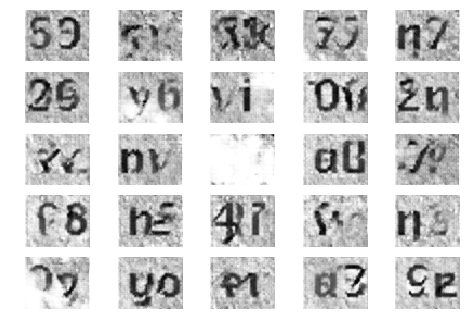

3101 [D loss: 0.041239, acc.: 100.00%] [G loss: 5.947973]
3102 [D loss: 0.127197, acc.: 96.88%] [G loss: 4.518830]
3103 [D loss: 0.875014, acc.: 60.94%] [G loss: 2.823962]
3104 [D loss: 0.175537, acc.: 89.06%] [G loss: 3.727813]
3105 [D loss: 0.054174, acc.: 100.00%] [G loss: 5.811264]
3106 [D loss: 0.474944, acc.: 75.00%] [G loss: 3.265925]
3107 [D loss: 0.190489, acc.: 93.75%] [G loss: 3.810337]
3108 [D loss: 0.123775, acc.: 93.75%] [G loss: 4.702783]
3109 [D loss: 0.235562, acc.: 95.31%] [G loss: 4.264175]
3110 [D loss: 0.444814, acc.: 75.00%] [G loss: 2.176502]
3111 [D loss: 0.923470, acc.: 65.62%] [G loss: 5.309866]
3112 [D loss: 0.382898, acc.: 84.38%] [G loss: 4.246762]
3113 [D loss: 0.073232, acc.: 98.44%] [G loss: 4.661530]
3114 [D loss: 0.543070, acc.: 79.69%] [G loss: 3.652445]
3115 [D loss: 0.138481, acc.: 93.75%] [G loss: 4.317492]
3116 [D loss: 0.058391, acc.: 98.44%] [G loss: 4.994221]
3117 [D loss: 0.660824, acc.: 76.56%] [G loss: 2.282516]
3118 [D loss: 0.442701, acc.:

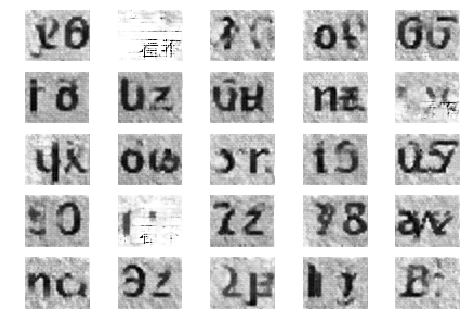

3151 [D loss: 0.094012, acc.: 98.44%] [G loss: 3.609408]
3152 [D loss: 0.066453, acc.: 100.00%] [G loss: 2.174749]
3153 [D loss: 0.226349, acc.: 90.62%] [G loss: 2.163389]
3154 [D loss: 0.221085, acc.: 92.19%] [G loss: 3.476162]
3155 [D loss: 0.352749, acc.: 85.94%] [G loss: 3.576040]
3156 [D loss: 0.212676, acc.: 90.62%] [G loss: 4.825953]
3157 [D loss: 0.345967, acc.: 90.62%] [G loss: 3.537242]
3158 [D loss: 0.315163, acc.: 87.50%] [G loss: 2.948439]
3159 [D loss: 0.446341, acc.: 81.25%] [G loss: 3.473832]
3160 [D loss: 0.144396, acc.: 93.75%] [G loss: 4.497351]
3161 [D loss: 0.258107, acc.: 85.94%] [G loss: 3.253906]
3162 [D loss: 0.409714, acc.: 81.25%] [G loss: 4.532013]
3163 [D loss: 0.197147, acc.: 93.75%] [G loss: 4.478324]
3164 [D loss: 0.282790, acc.: 92.19%] [G loss: 2.463515]
3165 [D loss: 0.299585, acc.: 90.62%] [G loss: 3.762469]
3166 [D loss: 0.203355, acc.: 93.75%] [G loss: 3.868839]
3167 [D loss: 0.337567, acc.: 85.94%] [G loss: 4.051641]
3168 [D loss: 0.341491, acc.: 

KeyboardInterrupt: ignored

In [31]:
if __name__ == '__main__':
    dcgan = DCGAN()
    dcgan.train(epochs=4000, batch_size=32, save_interval=50, data_set = data_set)